In [1]:
import os
import sys
import random
import time
from random import seed, randint
import argparse
import platform
from datetime import datetime
import imp
import numpy as np
import fileinput
from itertools import product
import pandas as pd
from scipy.interpolate import griddata
from scipy.interpolate import interp2d
import seaborn as sns
from os import listdir

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import griddata
import matplotlib as mpl
# sys.path.insert(0,'..')
# from notebookFunctions import *
# from .. import notebookFunctions
from Bio.PDB.Polypeptide import one_to_three
from Bio.PDB.Polypeptide import three_to_one
from Bio.PDB.PDBParser import PDBParser
from pyCodeLib import *
# from small_script.myFunctions import *
sys.path.insert(0, "/Users/weilu/openmmawsem")
from helperFunctions.myFunctions import *
from collections import defaultdict
%matplotlib inline
# plt.rcParams['figure.figsize'] = (10,6.180)    #golden ratio
# %matplotlib notebook
%load_ext autoreload
%autoreload 2

In [2]:
plt.rcParams['figure.figsize'] = np.array([16.18033, 10])    #golden ratio
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['figure.dpi'] = 100
plt.rcParams.update({'font.size': 22})

In [3]:
# pre = "/Users/weilu/Research/server_backup/feb_2019/jan_optimization/gammas/"
# pre = "/Users/weilu/Research/server/april_2019/optimization_test/gammas/"
# pre = "/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_7_larger_set/optimization/gammas/"
# trial_name = "trial_6"
# pre = "/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_5/optimization/gammas/"
# trial_name = "trial_5"
pre = "/Users/weilu/Research/server/oct_2019/membrane_optimization/optimization/gammas/"
trial_name = "trial_1"


# pp = f"protein_list_phi_pairwise_contact_well4.5_6.5_5.0_10phi_density_mediated_contact_well6.5_9.5_5.0_10_2.6_7.0phi_burial_well4.0"
# pp = f"protein_list_phi_pairwise_contact_well4.5_6.5_5.0_10phi_density_mediated_contact_well6.5_9.5_5.0_10_2.6_7.0phi_burial_well4.0phi_debye_huckel_well0"
pp = f"protein_list_phi_pairwise_contact_well4.5_6.5_5.0_10phi_density_mediated_contact_well6.5_9.5_5.0_10_2.6_7.0"

In [4]:
def get_filtered_gamma(pre, cutoff, pp):
    # pp = "cath-dataset-nonredundant-S20Clean_phi_pairwise_contact_well4.5_6.5_5.0_10phi_density_mediated_contact_well6.5_9.5_5.0_10_2.6_7.0"
    # pp = "proteins_name_list_phi_pairwise_contact_well4.5_6.5_5.0_10phi_density_mediated_contact_well6.5_9.5_5.0_10_2.6_7.0phi_burial_well4.0"

    A_name = pp + "_A"
    B_name = pp + "_B"
    B_filtered_name = pp + "_B_filtered"
    P_name = pp + "_P"
    Gamma_name = pp + "_gamma"
    Gamma_filtered_name = pp + "_gamma_filtered"
    Lamb_name = pp + "_lamb"
    Lamb_filtered_name = pp + "_lamb_filtered"

    A = np.loadtxt(pre+A_name)
    B = np.loadtxt(pre+B_name)
    B_filtered = np.loadtxt(pre+B_filtered_name, dtype=complex, converters={
                               0: lambda s: complex(s.decode().replace('+-', '-'))})
    Gamma = np.loadtxt(pre+Gamma_name)
    Gamma_filtered = np.loadtxt(pre+Gamma_filtered_name, dtype=complex, converters={
                               0: lambda s: complex(s.decode().replace('+-', '-'))})
    Lamb = np.loadtxt(pre+Lamb_name, dtype=complex, converters={
                               0: lambda s: complex(s.decode().replace('+-', '-'))})
    Lamb_filtered = np.loadtxt(pre+Lamb_filtered_name, dtype=complex, converters={
                               0: lambda s: complex(s.decode().replace('+-', '-'))})

    half_B_name = pp + "_half_B"
    half_B = np.loadtxt(pre+half_B_name)
    other_half_B_name = pp + "_other_half_B"
    other_half_B = np.loadtxt(pre+other_half_B_name)
    std_half_B_name = pp + "_std_half_B"
    std_half_B = np.loadtxt(pre+std_half_B_name)


    # pre = "/Users/weilu/Research/server/april_2019/"
    location = pre + f"../../phis/{pp}_phi_decoy_summary.txt"
    A_prime = np.loadtxt(location)
    
    lamb, P = np.linalg.eig(B)
    lamb, P = sort_eigenvalues_and_eigenvectors(lamb, P)
    filtered_lamb = np.copy(lamb)
    cutoff_mode = cutoff
    filtered_B_inv, filtered_lamb, P = get_filtered_B_inv_lambda_and_P(filtered_lamb, 
                                                                       cutoff_mode, P)
    filtered_gamma = np.dot(filtered_B_inv, A)
    filtered_B = np.linalg.inv(filtered_B_inv)

    return A, A_prime, filtered_gamma, filtered_B_inv



In [44]:
gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/original_gamma"
original_gamma = np.loadtxt(gamma_file_name)
original_gamma = original_gamma[:630]

cutoff_list = [100, 200, 300, 400, 500]
cutoff_list += [10, 20, 30, 40, 50, 80]
for cutoff_i in cutoff_list:
    A, A_prime, filtered_gamma, filtered_B_inv = get_filtered_gamma(pre, cutoff_i, pp)
    c = np.dot(A_prime, original_gamma)
    B_inv = filtered_B_inv
    lambda_2 = (A_prime.dot(B_inv).dot(A) - c) / (A_prime.dot(B_inv).dot(A_prime) )
    gamma_new = B_inv.dot(A-A_prime*lambda_2)
    save_gamma_pre = "/Users/weilu/Research/server/oct_2019/membrane_saved_gammas/"
    np.savetxt(f"{save_gamma_pre}/{trial_name}_cutoff{cutoff_i}_impose_Aprime_constraint", gamma_new)

In [47]:
os.path.basename("proteins_name_list/proteins_name_list_0.txt")

'proteins_name_list_0.txt'

In [6]:
np.dot(A_prime, original_gamma)

-114.9790142084

In [7]:
np.dot(A_prime, filtered_gamma)

1.3363947943675636

In [8]:
np.dot(A_prime, gamma_new)

-114.9790142084

In [42]:
np.dot(A_prime, membrane_gamma_original) * 200

-19.177542424000002

In [41]:
np.dot(A_prime, membrane_gamma_rescaled)

-11.085726997199998

In [30]:
def simulation_to_iteration_gamma(membrane_gamma):
    membrane_gamma = -membrane_gamma
    direct = membrane_gamma[:210][:,0]
    protein = membrane_gamma[210:][:,0]
    water = membrane_gamma[210:][:,1]
    return np.concatenate([direct, protein, water])

In [31]:
a = np.loadtxt("/Users/weilu/openmmawsem/parameters/membrane_gamma_original.dat")
membrane_gamma_original = simulation_to_iteration_gamma(a)

In [32]:
membrane_gamma_original_x_200 = membrane_gamma_original * 200 

In [33]:
np.savetxt("/Users/weilu/Research/server/oct_2019/membrane_saved_gammas/membrane_gamma_original_x_200", membrane_gamma_original_x_200)

In [34]:
np.savetxt("/Users/weilu/Research/server/oct_2019/membrane_saved_gammas/membrane_gamma_original", membrane_gamma_original)

In [35]:
a = np.loadtxt("/Users/weilu/openmmawsem/parameters/membrane_gamma_rescaled.dat")
membrane_gamma_rescaled = simulation_to_iteration_gamma(a)

In [36]:
np.savetxt("/Users/weilu/Research/server/oct_2019/membrane_saved_gammas/membrane_gamma_rescaled", membrane_gamma_rescaled)

In [49]:
pre = "/Users/weilu/Research/server/oct_2019/membrane_optimization/optimization"
fileName = f"{pre}/z_scores/proteins_name_list_0.csv"
a = pd.read_csv(fileName, index_col=0)

In [106]:
a_ = []
for i in range(472):
    fileName = f"{pre}/z_scores/proteins_name_list_{i}.csv"
    a = pd.read_csv(fileName, index_col=0, dtype=str)
    a_.append(a)

In [107]:
d = pd.concat(a_).reset_index()

In [113]:
# pd.set_option('display.float_format', '{:.2f}'.format)
# pd.reset_option('display.float_format')
d["E_native"] = d["E_native"].astype(float).round(3)
d["E_mgs"] = d["E_mgs"].astype(float).round(3)
d["Z_scores"] = d["Z_scores"].astype(float).round(3)
d["Std_mg"] = d["Std_mg"].astype(float).round(3)

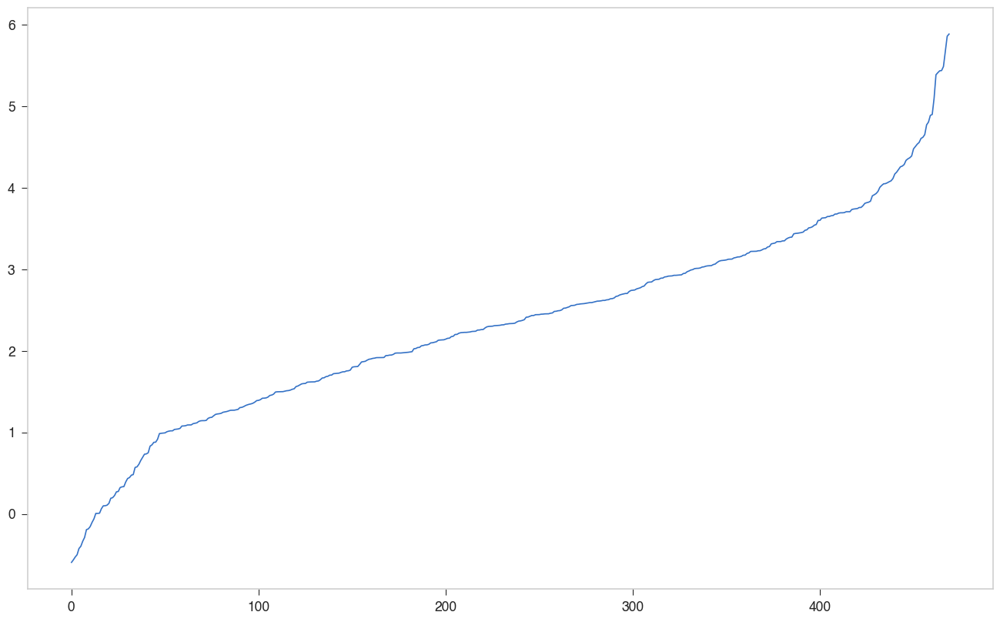

In [115]:
plt.plot(d.sort_values("Z_scores")["Z_scores"].reset_index(drop=True))

In [116]:
d.query("E_native > -4").sort_values("Z_scores")

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
107,0,1wrg,-0.594,-0.438,-0.512,0.124
241,0,2moz,-0.528,-2.185,-2.363,0.337
165,0,2lzr,-0.396,-0.000,-0.000,0.000
28,0,1rkl,-0.183,-0.000,-0.000,0.000
178,0,2m67,0.065,-3.974,-3.943,0.467
132,0,2lor,0.100,-2.045,-2.016,0.289
108,0,1jo5,0.130,-0.000,-0.000,0.000
71,0,2ksd,0.271,-3.099,-2.995,0.383
135,0,2los,0.990,-1.533,-1.307,0.229
106,0,2l16,1.145,-0.118,-0.072,0.040


In [117]:
skip_pdbs = d.query("E_native > -4").sort_values("Z_scores")["Protein"].to_list()

In [ ]:
# single helix 
# 1wrg, 2lat, 2k8j
# 1wrg, 2moz, 2lzr, 1rkl, ...

In [118]:
len(skip_pdbs)

11

In [88]:
pre

'/Users/weilu/Research/server/oct_2019/membrane_optimization/optimization'

In [119]:
filtered = d.query("Protein not in @skip_pdbs").reset_index()

In [120]:
filtered.to_csv("/Users/weilu/Research/server/oct_2019/membrane_optimization/optimization/remove_single_helix.csv")

In [121]:
filtered_pdb_list = filtered["Protein"].to_list()
fileLocation = f"{pre}/remove_single_helix"
with open(fileLocation, "w") as out:
    for pdbName in filtered_pdb_list:
        out.write(f"{pdbName}\n")


In [86]:
filtered.shape

(459, 7)

In [66]:
d[d['E_mgs'].isnull()]

,index,Protein,Z_scores,E_native,E_mgs,Std_mg
29,0,2lat,NaN,NaN,NaN,NaN
402,0,2k8j,NaN,NaN,NaN,NaN


In [39]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_tiny", gamma_file_name, "shuffle", 2000, mode=0)
data


/Users/weilu/Research/server/oct_2019/membrane_saved_gammas//trial_1_cutoff100_impose_Aprime_constraint
0 2.4160784004969145


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,3pl9,2.416078,-18.218497,-15.980836,0.926154
1,2cfp,2.576933,-130.922540,-123.786005,2.769391
2,1pw4,1.393806,-145.656746,-141.511771,2.973853
3,1nkz,1.020228,-76.172261,-74.208552,1.924774
4,1ijd,2.892559,-56.426030,-51.971928,1.539848
5,1r3j,2.930085,-122.999323,-115.031499,2.719315
6,1s5h,1.305426,-119.858517,-116.312045,2.716717
7,1xio,5.414357,-68.103437,-57.694860,1.922403
8,3cap,3.084502,-144.910933,-136.279541,2.798310
9,1a91,1.107687,-15.269046,-14.322163,0.854830


In [43]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
gamma_file_name = "/Users/weilu/Research/server/oct_2019/membrane_saved_gammas/membrane_gamma_original_x_200"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_tiny", gamma_file_name, "shuffle", 2000, mode=0)
data


/Users/weilu/Research/server/oct_2019/membrane_saved_gammas/membrane_gamma_original_x_200
0 1.4341744580919886


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,3pl9,1.434174,-7.912067,0.118046,5.599119
1,2cfp,2.488869,-56.522685,-18.034882,15.463976
2,1pw4,1.256396,-43.476530,-20.961369,17.920431
3,1nkz,1.329229,-0.671881,16.094604,12.613690
4,1ijd,1.640397,-0.470961,16.762521,10.505674
5,1r3j,0.091338,-26.889091,-25.488799,15.330832
6,1s5h,1.730358,-53.438509,-26.360473,15.648806
7,1xio,-2.335407,12.201653,-12.570400,10.607168
8,3cap,-1.336446,-2.017895,-23.812770,16.308082
9,1a91,1.915707,-12.263898,-2.685065,5.000155


In [45]:
cutoff = 300
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list_tiny", gamma_file_name, "shuffle", 2000, mode=0)
data


/Users/weilu/Research/server/oct_2019/membrane_saved_gammas//trial_1_cutoff300_impose_Aprime_constraint
0 2.1082095596486288


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,3pl9,2.108210,-18.111040,-15.944863,1.027496
1,2cfp,2.985436,-132.617635,-123.755887,2.968326
2,1pw4,2.972637,-150.946696,-141.438556,3.198555
3,1nkz,1.725864,-77.580261,-73.767674,2.209088
4,1ijd,3.886191,-58.464228,-51.571025,1.773769
5,1r3j,3.393840,-125.090652,-115.129651,2.935024
6,1s5h,2.454891,-123.646529,-116.389547,2.956132
7,1xio,6.111875,-70.139838,-57.708643,2.033941
8,3cap,3.669071,-147.497957,-136.290634,3.054540
9,1a91,1.566195,-15.812291,-14.348810,0.934418


In [ ]:
gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/original_gamma"
original_gamma = np.loadtxt(gamma_file_name)
original_gamma = original_gamma[:630]

cutoff_i = 100

A, A_prime, filtered_gamma, filtered_B_inv = get_filtered_gamma(pre, cutoff_i, pp)
c = np.dot(A_prime, original_gamma)
B_inv = filtered_B_inv
lambda_2 = (A_prime.dot(B_inv).dot(A) - c) / (A_prime.dot(B_inv).dot(A_prime) )
gamma_new = B_inv.dot(A-A_prime*lambda_2)

In [23]:
gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/original_gamma"
original_gamma = np.loadtxt(gamma_file_name)
a = list(original_gamma)
a.append(1)
original_gamma_deybe = np.array(a)
# we want to impose additional contraint so that A' * gamma = constnat.(-562.23)
cutoff_list = [100, 200, 300, 400, 500]
cutoff_list += [10, 20, 30, 40, 50, 80]
for cutoff_i in cutoff_list:
    A, A_prime, filtered_gamma, filtered_B_inv = get_filtered_gamma(pre, cutoff_i, pp)
    c = np.dot(A_prime, original_gamma_deybe)
#     c = np.dot(A_prime, original_gamma)
    B_inv = filtered_B_inv
    lambda_2 = (A_prime.dot(B_inv).dot(A) - c) / (A_prime.dot(B_inv).dot(A_prime) )
    gamma_new = B_inv.dot(A-A_prime*lambda_2)
    # impose A'gamma
    save_gamma_pre = "/Users/weilu/Research/server/sep_2019/saved_gammas/"
    np.savetxt(f"{save_gamma_pre}/{trial_name}_cutoff{cutoff_i}_impose_Aprime_constraint", gamma_new)

In [7]:
cutoff = 300
A, A_prime, filtered_gamma, filtered_B_inv = get_filtered_gamma(pre, cutoff)

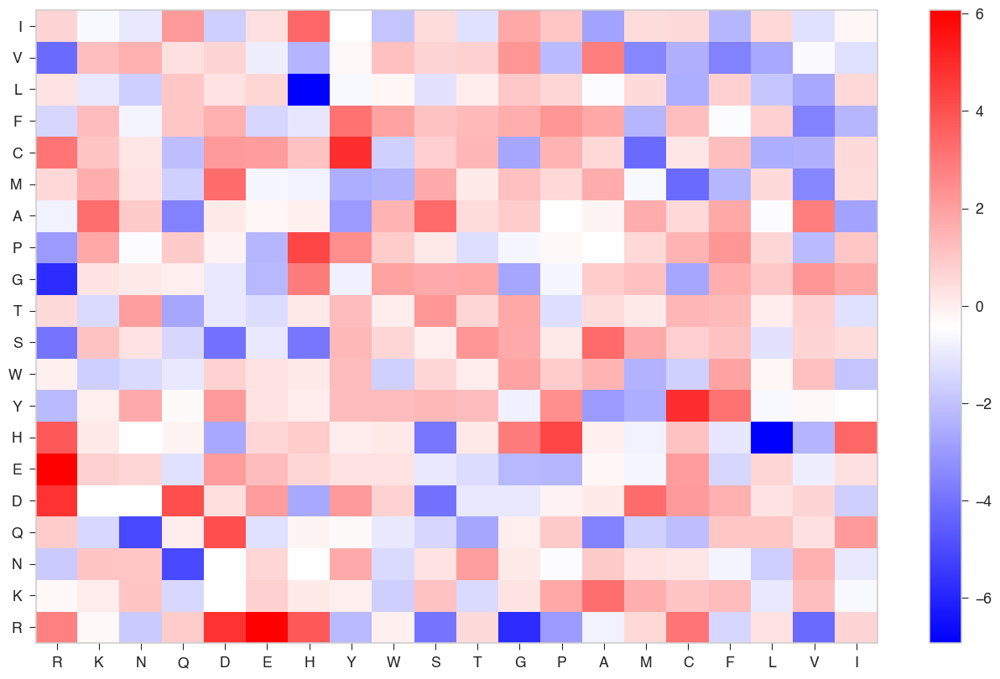

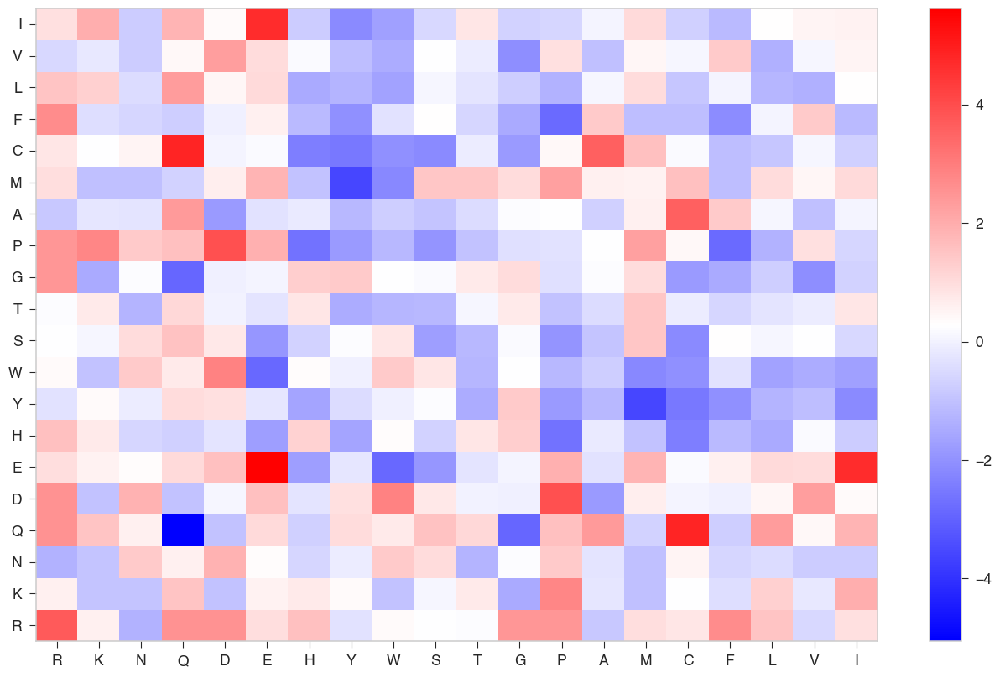

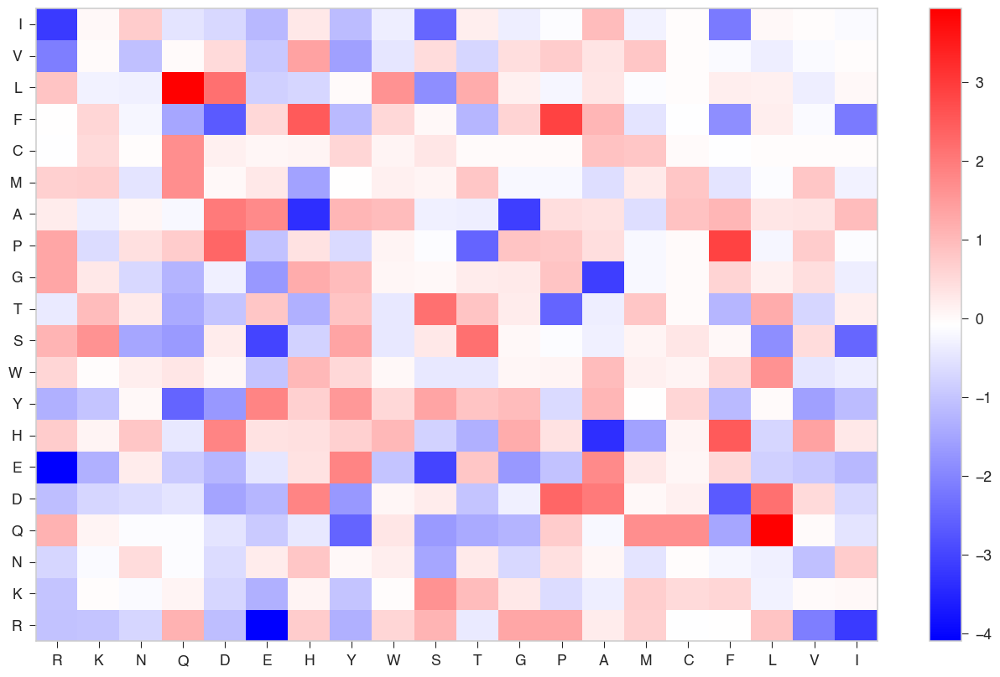

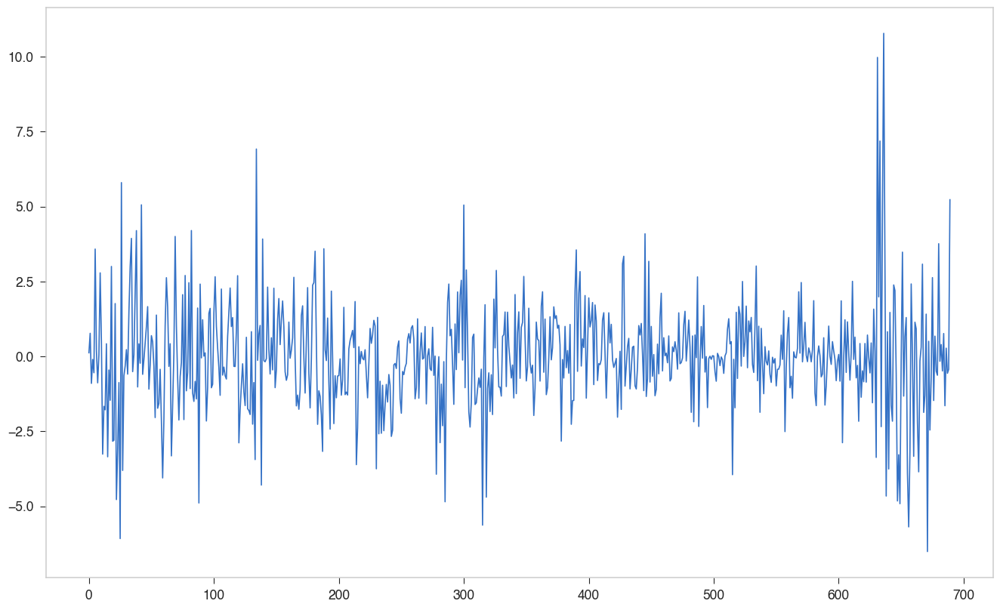

In [9]:
plot_contact_well(filtered_gamma[:210], inferBound=True)
plot_contact_well(filtered_gamma[210:420], inferBound=True)
plot_contact_well(filtered_gamma[420:], inferBound=True)
plt.plot(filtered_gamma)

In [10]:
# maximum difference between loaded and computed is 1e-5.
max(lamb-Lamb)

(1.417108159994327e-05+0j)

In [13]:
save_gamma_pre = "/Users/weilu/Research/server/sep_2019/saved_gammas/"
np.savetxt(f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}", filtered_gamma)

In [8]:
# os.chdir('/Users/weilu/opt/notebook/Optimization')

In [45]:
gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/original_gamma"
original_gamma = np.loadtxt(gamma_file_name)

In [46]:
np.dot(A_prime, original_gamma)

-551.780941107728

In [58]:
gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/original_gamma"
original_gamma = np.loadtxt(gamma_file_name)
# we want to impose additional contraint so that A' * gamma = constnat.(-562.23)
cutoff_list = [100, 200, 300, 400, 500]
for cutoff_i in cutoff_list:
    A, A_prime, filtered_gamma, filtered_B_inv = get_filtered_gamma(pre, cutoff_i)
    c = np.dot(A_prime, original_gamma)
    B_inv = filtered_B_inv
    lambda_2 = (A_prime.dot(B_inv).dot(A) - c) / (A_prime.dot(B_inv).dot(A_prime) )
    gamma_new = B_inv.dot(A-A_prime*lambda_2)
    # impose A'gamma
    save_gamma_pre = "/Users/weilu/Research/server/sep_2019/saved_gammas/"
    np.savetxt(f"{save_gamma_pre}/{trial_name}_cutoff{cutoff_i}_impose_Aprime_constraint", gamma_new)

In [48]:
np.dot(A_prime, gamma_new)

-551.7809411077282

In [41]:
def output_E_decoy(hamiltonian, training_set_file, gamma_file_name, training_decoy_method, num_decoys, test_set_file=None, test_decoy_method=None, use_filtered_gammas=False, **kwargs):
    if test_set_file is None:
        test_set_file = training_set_file
    if test_decoy_method is None:
        test_decoy_method = training_decoy_method
    test_set = read_column_from_file(test_set_file, 1)
    z_scores = []
    e_natives = []
    e_mgs = []
    e_mg_stds = []
    e_decoys = []
    names = []
    for i, protein in enumerate(test_set):
#         print(i, protein)
        # print(protein, hamiltonian, training_set_file, gamma_file_name, test_decoy_method, num_decoys, use_filtered_gammas)
        e_native, e_decoy = evaluate_hamiltonian_wei(
            protein, hamiltonian, training_set_file, gamma_file_name, test_decoy_method, num_decoys, use_filtered_gammas, outputDecoy=True, **kwargs)
        # print(protein, z)
        e_natives.append(e_native)
        e_decoys.append(e_decoy)
        names.append(protein)
    return names, e_natives, e_decoys

do = os.system

In [42]:
# pre = "/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_5/optimization/gammas/"
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"

names, e_natives, e_decoys = output_E_decoy("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)



In [43]:
# figure_folder = "/Users/weilu/Dropbox/Optimization_Xfunnel/Oct01_new_dataset_figures"
figure_folder = "/Users/weilu/Dropbox/Optimization_Xfunnel/Oct12_newData_cutoff100_figures"
do(f"mkdir -p {figure_folder}")
for name, e_native, e_decoy in zip(names, e_natives, e_decoys):
    # print(name)
    plt.figure()
    _ = plt.hist(e_decoy, bins=50)
    plt.vlines(e_native, ymin=0, ymax=100, color="red")
    _ = plt.title(name)
    plt.savefig(f"{figure_folder}/{name}.png")
    plt.close()

In [20]:
# pre = "/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_5/optimization/gammas/"
cutoff = 50
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"

names, e_natives, e_decoys = output_E_decoy("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)

figure_folder = f"/Users/weilu/Dropbox/Optimization_Xfunnel/Oct01_new_dataset_figures_cutoff{cutoff}"
do(f"mkdir -p {figure_folder}")
for name, e_native, e_decoy in zip(names, e_natives, e_decoys):
    # print(name)
    plt.figure()
    _ = plt.hist(e_decoy, bins=50)
    plt.vlines(e_native, ymin=0, ymax=100, color="red")
    _ = plt.title(name)
    plt.savefig(f"{figure_folder}/{name}.png")
    plt.close()

In [21]:
# pre = "/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_5/optimization/gammas/"
cutoff = 200
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"

names, e_natives, e_decoys = output_E_decoy("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)

figure_folder = f"/Users/weilu/Dropbox/Optimization_Xfunnel/Oct01_new_dataset_figures_cutoff{cutoff}"
do(f"mkdir -p {figure_folder}")
for name, e_native, e_decoy in zip(names, e_natives, e_decoys):
    # print(name)
    plt.figure()
    _ = plt.hist(e_decoy, bins=50)
    plt.vlines(e_native, ymin=0, ymax=100, color="red")
    _ = plt.title(name)
    plt.savefig(f"{figure_folder}/{name}.png")
    plt.close()

Text(0.5, 1.0, 'red is Z of with debye, blue is without, cutoff 100')

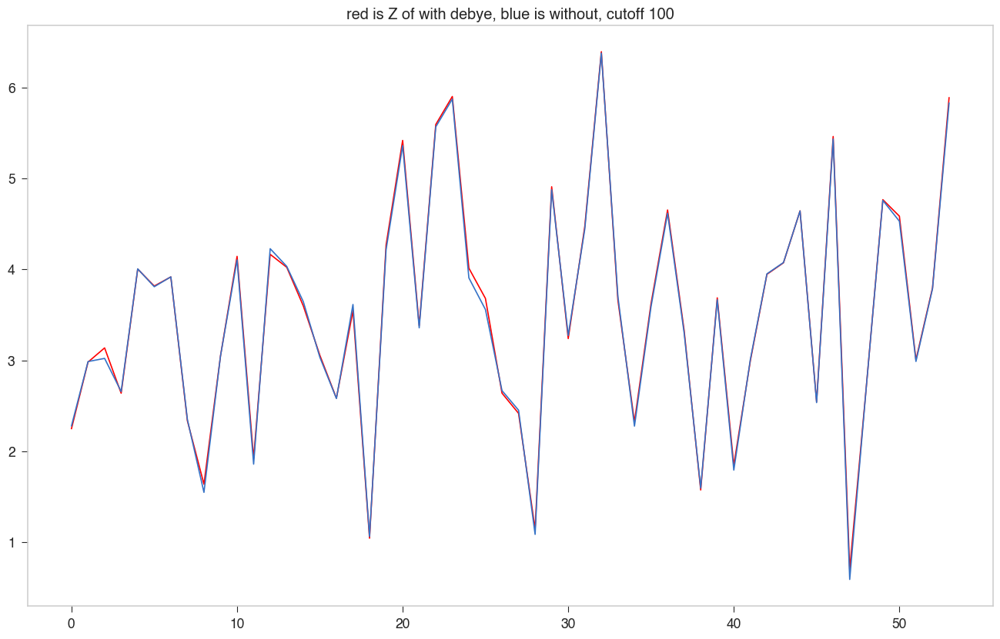

In [73]:
plt.plot(data_with_debye["Z_scores"], color="red")
plt.plot(data_without_debye["Z_scores"])
plt.title("red is Z of with debye, blue is without, cutoff 100")

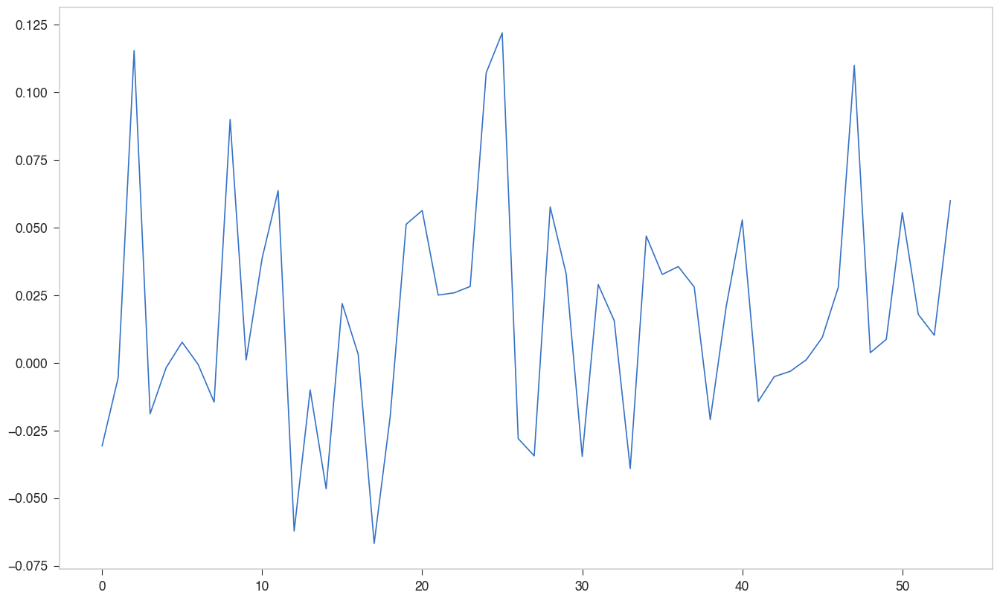

In [67]:
# plt.plot(data_with_debye["Z_scores"], color="red")
# plt.plot(data_without_debye["Z_scores"])
plt.plot(data_with_debye["Z_scores"] - data_without_debye["Z_scores"])

In [32]:
data.to_feather("oct12_trial_12_cutoff100.feather")

In [33]:
data.to_csv("oct12_trial12_cutoff100.csv")

In [18]:
d = pd.read_feather("oct10_cutoff100.feather")

/Users/weilu/anaconda3/envs/py36/lib/python3.6/site-packages/pyarrow/pandas_compat.py:752: FutureWarning: .labels was deprecated in version 0.24.0. Use .codes instead.
  labels, = index.labels


In [37]:
d_s = data.sort_values("Z_scores")

In [40]:
d_s.reset_index(drop=True).to_csv("oct12_trial12_cutoff100_sorted.csv")

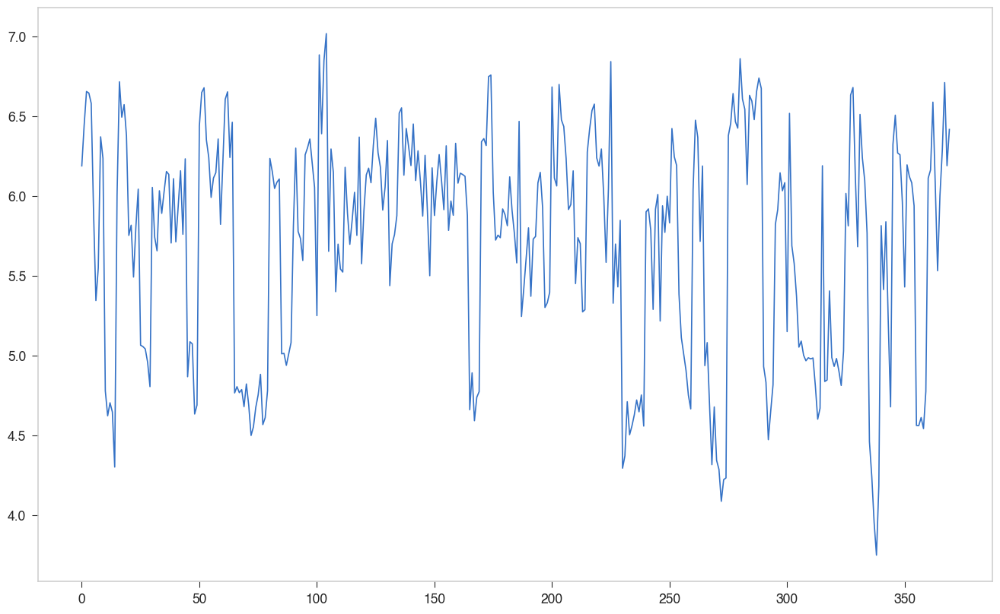

In [21]:
plt.plot(d["Z_scores"])

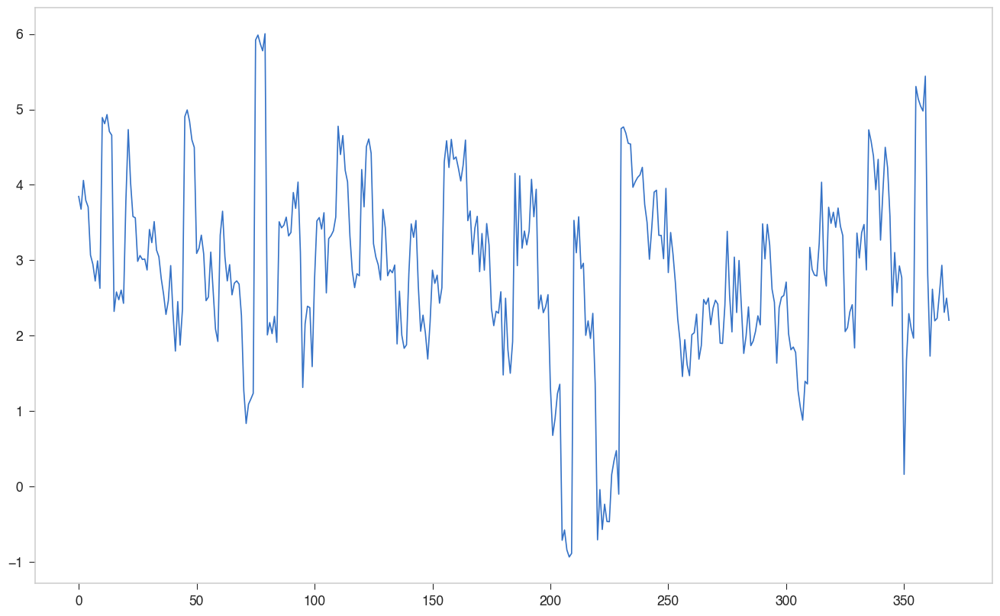

In [31]:
plt.plot(data["Z_scores"])

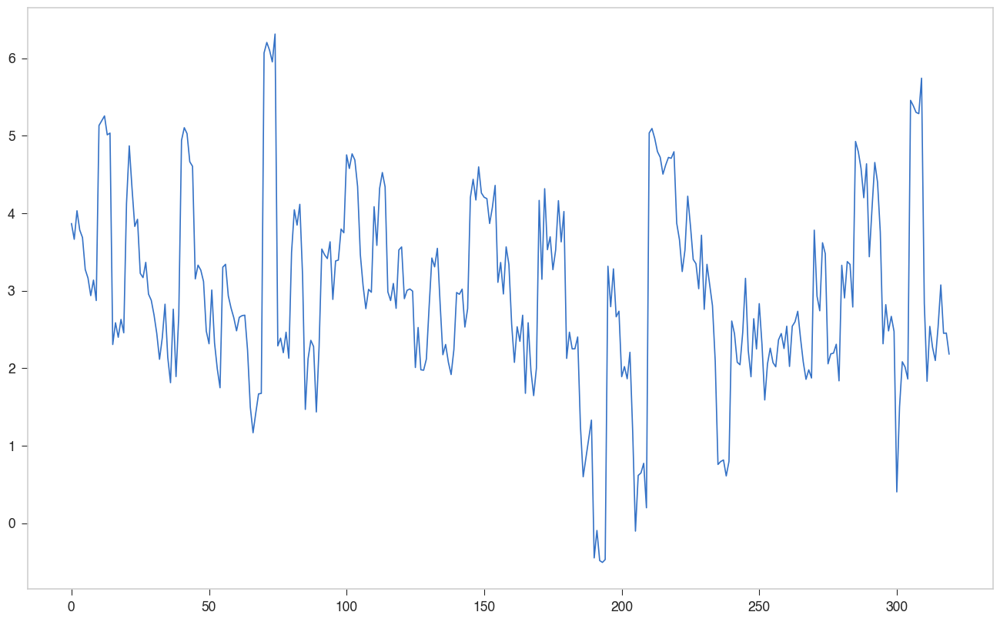

In [26]:
plt.plot(data["Z_scores"])

In [24]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_12_remove_9_cases_cutoff100_impose_Aprime_constraint
0 3.8660462122447967


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,51_AWSEM_1,3.866046,-595.095331,-570.682280,6.314733
1,51_AWSEM_23,3.664308,-589.877245,-567.688701,6.055317
2,51_AWSEM_45,4.032458,-592.660202,-568.045579,6.104124
3,51_AWSEM_67,3.783948,-579.766060,-559.175803,5.441474
4,51_AWSEM_89,3.686977,-588.866770,-567.574865,5.774895
5,15_AWSEM_1,3.274713,-562.392649,-544.912901,5.337796
6,15_AWSEM_23,3.164446,-590.926363,-573.495777,5.508259
7,15_AWSEM_45,2.937315,-584.574782,-567.698125,5.745607
8,15_AWSEM_67,3.137804,-566.097231,-549.278547,5.360017
9,15_AWSEM_89,2.873949,-581.038918,-565.356177,5.456862


In [14]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_12_bad_case_cutoff100_impose_Aprime_constraint
0 5.584092733426742


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,46_10mer_AWSEM_1,5.584093,-610.957742,-566.853221,7.898243
1,46_10mer_AWSEM_23,5.559969,-602.178446,-555.672351,8.364452
2,46_10mer_AWSEM_45,5.423183,-600.814706,-556.418486,8.186376
3,46_10mer_AWSEM_67,5.205593,-601.300758,-560.236149,7.888555
4,46_10mer_AWSEM_89,5.271818,-589.652156,-548.584308,7.790074
5,58_AWSEM_1,3.321337,-549.732641,-529.855058,5.984813
6,58_AWSEM_23,2.753668,-545.431456,-530.449850,5.440601
7,58_AWSEM_45,3.820378,-558.345435,-537.437137,5.472835
8,58_AWSEM_67,3.315592,-576.038823,-557.472465,5.599711
9,58_AWSEM_89,3.574279,-572.529958,-554.544748,5.031843


In [30]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_12_cutoff100_impose_Aprime_constraint
0 3.8461189436350427


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,51_AWSEM_1,3.846119,-593.905894,-572.306897,5.615790
1,51_AWSEM_23,3.677120,-590.769543,-571.215032,5.317887
2,51_AWSEM_45,4.058946,-595.611742,-573.706782,5.396711
3,51_AWSEM_67,3.794377,-582.019030,-563.768433,4.809906
4,51_AWSEM_89,3.706650,-589.655816,-570.546796,5.155335
5,15_AWSEM_1,3.068158,-563.906373,-549.023972,4.850599
6,15_AWSEM_23,2.947375,-591.909348,-577.285026,4.961812
7,15_AWSEM_45,2.724752,-584.225025,-570.255812,5.126783
8,15_AWSEM_67,2.992641,-568.287833,-553.946918,4.792060
9,15_AWSEM_89,2.627997,-580.963573,-567.884654,4.976764


In [8]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_12_screening_length20_cutoff100_impose_Aprime_constraint
0 3.855236724536389


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,51_AWSEM_1,3.855237,-598.024498,-576.414260,5.605424
1,51_AWSEM_23,3.682063,-594.814920,-575.262031,5.310308
2,51_AWSEM_45,4.066710,-599.738304,-577.827986,5.387726
3,51_AWSEM_67,3.801059,-586.138945,-567.882964,4.802867
4,51_AWSEM_89,3.714567,-593.781895,-574.671176,5.144803
5,15_AWSEM_1,3.067768,-567.478283,-552.586756,4.854190
6,15_AWSEM_23,2.948446,-595.649957,-581.025550,4.960039
7,15_AWSEM_45,2.724847,-587.858300,-573.883563,5.128631
8,15_AWSEM_67,2.994581,-571.911952,-557.560240,4.792560
9,15_AWSEM_89,2.629769,-584.571632,-571.488312,4.975084


In [9]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_10_cutoff100_impose_Aprime_constraint
0 6.042074857765354


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,51_AWSEM_0,6.042075,-638.638854,-575.874692,10.387849
1,51_AWSEM_1,6.042075,-638.638854,-575.874692,10.387849
2,51_AWSEM_2,6.042075,-638.638854,-575.874692,10.387849
3,51_AWSEM_3,6.042075,-638.638854,-575.874692,10.387849
4,51_AWSEM_4,6.042075,-638.638854,-575.874692,10.387849
5,15_AWSEM_0,5.015303,-630.851545,-576.719156,10.793444
6,15_AWSEM_1,5.015303,-630.851545,-576.719156,10.793444
7,15_AWSEM_2,5.015303,-630.851545,-576.719156,10.793444
8,15_AWSEM_3,5.015303,-630.851545,-576.719156,10.793444
9,15_AWSEM_4,5.015303,-630.851545,-576.719156,10.793444


In [ ]:
data

In [90]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_9_subset_cutoff100_impose_Aprime_constraint
0 2.526743321739536


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,5MEN,2.526743,-594.497713,-578.878588,6.181524
1,5W1W,4.554255,-541.091785,-516.305154,5.442522
2,6AMU,6.896244,-622.276400,-572.490243,7.219315
3,5C07,4.007267,-560.280670,-536.166641,6.017574
4,3H9S,4.038045,-593.931500,-568.859903,6.208846
5,5NMG,3.542838,-563.813588,-541.313489,6.350870
6,2F54,7.817801,-620.732387,-567.029663,6.869287
7,2BNQ,6.962344,-620.309725,-575.243419,6.472864
8,5D2L,3.749879,-575.258886,-549.423540,6.889648


# with debye huckel term

In [60]:
data_with_debye = data

In [59]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_8_with_debye_cutoff100_impose_Aprime_constraint
0 2.247796832807929


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,5NMG,2.247797,-577.083321,-567.262465,4.369103
1,1BD2,2.980757,-584.463294,-571.078867,4.490277
2,6BJ8,3.136623,-564.817118,-551.845977,4.135384
3,5NMF,2.637432,-575.529644,-564.464620,4.195378
4,2JCC,4.005054,-592.178845,-573.197823,4.739267
5,1AO7,3.818185,-588.131420,-568.645888,5.103349
6,1LP9,3.918650,-605.092999,-586.750652,4.680782
7,3GSN,2.333706,-589.847093,-579.109709,4.601002
8,6AMU,1.635513,-588.116347,-581.085682,4.298753
9,1QRN,3.048917,-593.148564,-577.527377,5.123520


# without debye huckel term


In [58]:

cutoff = 100
os.chdir(f"{pre}/..")
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas//trial_8_2_cutoff100_impose_Aprime_constraint"
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
# gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("old_phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data_without_debye = data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_8_2_cutoff100_impose_Aprime_constraint
0 2.2784483413708445


In [22]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_8_cutoff100_impose_Aprime_constraint
0 2.1142059768549806


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,5NMG,2.114206,-566.269115,-556.700159,4.526029
1,1BD2,2.601492,-574.174127,-561.763085,4.770741
2,6BJ8,2.440258,-556.239323,-545.652727,4.338310
3,5NMF,2.637599,-564.939954,-553.349075,4.394481
4,2JCC,3.731591,-580.750158,-563.136672,4.720101
5,1AO7,3.440299,-576.643815,-558.290400,5.334832
6,1LP9,3.616405,-592.218127,-575.373235,4.657911
7,3QDJ,4.955857,-598.184040,-570.311231,5.624216
8,3GSN,2.051890,-581.842478,-571.601840,4.990833
9,6AMU,1.154772,-579.834689,-574.452190,4.661091


In [23]:
data.query("Z_scores > 4")

,Protein,Z_scores,E_native,E_mgs,Std_mg
7,3QDJ,4.955857,-598.184040,-570.311231,5.624216
13,4JFE,5.026273,-608.633762,-577.112688,6.271261
15,4EUP,4.171874,-585.672038,-563.729911,5.259538
18,4JFD,4.503334,-605.473914,-577.328571,6.249890
21,6EQA,6.412591,-600.369083,-562.359304,5.927367
22,5C0B,5.211318,-555.095765,-531.838478,4.462841
24,3UTT,5.328415,-582.344157,-556.545238,4.841763
25,3UTS,5.339894,-556.188084,-532.338138,4.466371
29,3QDG,5.402474,-610.583724,-577.445281,6.133938
32,2VLJ,4.755455,-567.570953,-543.609936,5.038638


In [15]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


/Users/weilu/Research/server/sep_2019/saved_gammas//trial_8_cutoff100_impose_Aprime_constraint
0 2.1142059768549806


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,5NMG,2.114206,-566.269115,-556.700159,4.526029
1,1BD2,2.601492,-574.174127,-561.763085,4.770741
2,6BJ8,2.440258,-556.239323,-545.652727,4.338310
3,5NMF,2.637599,-564.939954,-553.349075,4.394481
4,2JCC,3.731591,-580.750158,-563.136672,4.720101
5,1AO7,3.440299,-576.643815,-558.290400,5.334832
6,1LP9,3.616405,-592.218127,-575.373235,4.657911
7,3QDJ,4.955857,-598.184040,-570.311231,5.624216
8,3GSN,2.051890,-581.842478,-571.601840,4.990833
9,6AMU,1.154772,-579.834689,-574.452190,4.661091


In [10]:
cutoff = 100
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


0 0.9330926836023296


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,5NMG,0.933093,-548.379489,-543.548434,5.177465
1,1BD2,1.833941,-573.756696,-565.003499,4.772888
2,6BJ8,2.566187,-556.959212,-544.189681,4.976072
3,5NMF,1.497182,-549.136484,-542.021523,4.752237
4,2JCC,3.962219,-585.261879,-563.947176,5.379487
5,1AO7,2.720192,-589.310177,-574.645145,5.391175
6,1LP9,3.907723,-586.786761,-565.825316,5.364107
7,3QDJ,4.016266,-592.957514,-571.605210,5.316456
8,3GSN,1.891736,-581.696782,-571.540201,5.368920
9,6AMU,2.443339,-594.407545,-582.378359,4.923257


In [13]:
data.query("Z_scores > 5")

,Protein,Z_scores,E_native,E_mgs,Std_mg
10,3FFC,43.049260,-757.932766,-542.509124,5.004119
11,5BS0,34.849712,-689.169190,-518.229631,4.905049
23,5WKF,40.749733,-722.046040,-488.974923,5.719574
24,6EQA,5.637944,-593.415051,-561.631693,5.637402
30,4QRP,27.747998,-669.360299,-523.076236,5.271878
39,5HYJ,5.038088,-559.567806,-534.720838,4.931825
51,5BRZ,42.669861,-740.213553,-531.285756,4.896379


In [31]:
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
print(gamma_file_name)
data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


0 4.479292940298622


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2,4.479293,-554.211510,-524.888912,6.546256
1,2JCC,7.713614,-601.915889,-548.906966,6.872125
2,1AO7,6.201762,-575.152737,-534.523389,6.551259
3,1LP9,7.940080,-607.913892,-549.673048,7.335045
4,3QDJ,6.640863,-627.896671,-583.640952,6.664152
5,3GSN,4.697146,-568.016980,-539.964369,5.972268
6,1QRN,5.659047,-614.717161,-580.601377,6.028539
7,3PWP,6.811802,-554.133964,-515.025196,5.741325
8,5W1W,3.169055,-537.147529,-511.567986,8.071663
9,1QSE,6.938600,-596.708635,-557.415004,5.663049


In [6]:
cutoff = 300
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


0 1.07706848542735


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,5NMG,1.077068,-462.308797,-451.783058,9.772581
1,1BD2,1.531907,-625.914769,-607.773559,11.842243
2,6BJ8,2.135040,-581.555271,-556.367908,11.797138
3,5NMF,0.491081,-481.226058,-476.541291,9.539706
4,2JCC,3.460976,-620.097337,-583.844408,10.474770
5,1AO7,3.545555,-674.819580,-637.438038,10.543214
6,1LP9,3.109455,-581.555924,-547.098036,11.081647
7,3QDJ,2.775675,-598.145488,-567.889887,10.900268
8,3GSN,0.287426,-536.293782,-532.825468,12.066819
9,6AMU,2.587655,-627.550125,-600.237813,10.554850


In [17]:
data.query("Protein == '1MI5'")

,Protein,Z_scores,E_native,E_mgs,Std_mg
45,1MI5,0.108921,-537.244798,-536.05067,10.963235


In [18]:
data

,Protein,Z_scores,E_native,E_mgs,Std_mg
0,5NMG,1.077068,-462.308797,-451.783058,9.772581
1,1BD2,1.531907,-625.914769,-607.773559,11.842243
2,6BJ8,2.135040,-581.555271,-556.367908,11.797138
3,5NMF,0.491081,-481.226058,-476.541291,9.539706
4,2JCC,3.460976,-620.097337,-583.844408,10.474770
5,1AO7,3.545555,-674.819580,-637.438038,10.543214
6,1LP9,3.109455,-581.555924,-547.098036,11.081647
7,3QDJ,2.775675,-598.145488,-567.889887,10.900268
8,3GSN,0.287426,-536.293782,-532.825468,12.066819
9,6AMU,2.587655,-627.550125,-600.237813,10.554850


In [16]:
data.query("Z_scores > 5").sort_values("Protein")

,Protein,Z_scores,E_native,E_mgs,Std_mg
10,3FFC,102.530173,-1655.925241,-582.889561,10.465560
13,3VXM,91.390255,-1648.879924,-697.428598,10.410862
43,3VXR,88.945589,-1493.467654,-542.072425,10.696373
38,3VXS,108.339064,-1748.730938,-561.456504,10.958877
42,3VXU,66.070844,-1422.095720,-485.558237,14.174747
31,4QRP,63.547110,-1359.458959,-550.737982,12.726322
55,5BRZ,65.875952,-1427.657221,-596.046817,12.623884
11,5BS0,78.546667,-1390.932355,-494.134761,11.417386
67,5C08,5.000478,-505.157307,-457.432050,9.544139
24,5WKF,81.412847,-1520.568816,-341.755842,14.479447


In [ ]:
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"

names, e_natives, e_decoys = output_E_decoy("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)



In [ ]:
figure_folder = "/Users/weilu/Dropbox/Optimization_Xfunnel/Sep29_figures"
do(f"mkdir -p {figure_folder}")
for name, e_native, e_decoy in zip(names, e_natives, e_decoys):
    # print(name)
    plt.figure()
    _ = plt.hist(e_decoy, bins=50)
    plt.vlines(e_native, ymin=0, ymax=100, color="red")
    _ = plt.title(name)
    plt.savefig(f"{figure_folder}/{name}.png")
    plt.close()

In [ ]:
cutoff = 300
os.chdir(f"{pre}/..")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = f"{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


In [119]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_specific_test/optimization/")
# evaluate_hamiltonian_wei(protein, hamiltonian, training_set_file, gamma_file_name, test_decoy_method, num_decoys, use_filtered_gammas=True, outputDecoy=False, **kwargs)
protein = "2BNQ"
# protein = "4FTV"
hamiltonian = "phi_list.txt"
training_set_file =  "protein_list" 
gamma_file_name = f"/Users/weilu/Research/server/sep_2019/saved_gammas/{save_gamma_pre}/{trial_name}_cutoff{cutoff}_impose_Aprime_constraint"
test_decoy_method = "shuffle"
num_decoys = 10
use_filtered_gammas = False
phi_list = read_phi_list(hamiltonian)
training_set = read_column_from_file(training_set_file, 1)
# read in Hamiltonian
# Find out how many total phi_i there are and get full parameter string
total_phis, full_parameters_string, num_phis = get_total_phis_and_parameter_string(
    phi_list, training_set, mode=0)
# print(total_phis, full_parameters_string, num_phis)
# read in corresponding gammas
# if use_filtered_gammas:
#     gamma_file_name = "%s%s_%s_gamma_filtered" % (
#         gammas_directory, training_set_file.split('/')[-1].split('.')[0], full_parameters_string)
# else:
#     pass
#     gamma_file_name = "%s%s_%s_gamma" % (gammas_directory, training_set_file.split(
#         '/')[-1].split('.')[0], full_parameters_string)

# Need to filter out the complex number if in the "filtered" mode;
# if use_filtered_gammas:
#     gamma = np.loadtxt(gamma_file_name, dtype=complex, converters={
#                        0: lambda s: complex(s.decode().replace('+-', '-'))})
# else:
#     gamma = np.loadtxt(gamma_file_name)
# gamma = np.loadtxt(gamma_file_name, dtype=complex, converters={
#                             0: lambda s: complex(s.decode().replace('+-', '-'))})
gamma = np.loadtxt(gamma_file_name)
# read in corresponding phis (native and decoys)
phi_native = read_native_phi(protein, phi_list, total_phis, mode=0)
phi_i_decoy = read_decoy_phis(
    protein, phi_list, total_phis, num_phis, num_decoys, test_decoy_method, mode=0)
# perform dot products to get energies (native and decoys)
e_decoy = np.zeros(num_decoys)
# print(gamma.shape, phi_native.shape)
e_native = np.dot(gamma, phi_native)
for i_decoy in range(num_decoys):
    e_decoy[i_decoy] = np.dot(gamma, phi_i_decoy[i_decoy])
e_mg = np.average(e_decoy)
e_mg_std = np.std(e_decoy)
# calculate z-score
z_score = (e_mg - e_native) / e_mg_std

In [120]:
np.dot(gamma, phi_native)

-605.7814622516905

In [ ]:
for i in range(2):
    for j in range(20):
        for k in range(j, 20):
            the_list.append(c)
            c += 1

In [94]:
gamma[:10]

array([-0.11803464, -0.12873059,  0.03765517,  0.01365024,  0.00311885,
        0.1551497 , -0.32315511, -0.18640831, -0.2656861 , -0.20895585])

In [89]:
np.dot(gamma[:210], phi_native[:210])

-47.428936288802966

In [91]:
np.dot(gamma[:210], phi_native[:210])

-47.428936288802966

In [83]:
np.dot(gamma[210:420], phi_native[210:420])

-462.8077411144142

In [84]:
np.dot(gamma[420:630], phi_native[420:630])

-4.460372079743105

In [92]:
np.dot(gamma[210:630], phi_native[210:630])

-400.90855931159706

In [93]:
np.dot(gamma[630:], phi_native[630:])

-159.7300541800085

In [87]:
np.dot(gamma, phi_native)

-674.7857324129609

In [90]:
np.dot(gamma, phi_native)

-608.0675497804086

In [96]:
-608.0675497/594.140

-1.0234415284276432

In [81]:
len(phi_native)

690

In [121]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_4/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_4_cutoff100_impose_Aprime_constraint"

names, e_natives, e_decoys = output_E_decoy("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)



1BD2 phi_list.txt protein_list /Users/weilu/Research/server/sep_2019/saved_gammas/trial_4_cutoff100_impose_Aprime_constraint shuffle 1000 False
2JCC phi_list.txt protein_list /Users/weilu/Research/server/sep_2019/saved_gammas/trial_4_cutoff100_impose_Aprime_constraint shuffle 1000 False
1AO7 phi_list.txt protein_list /Users/weilu/Research/server/sep_2019/saved_gammas/trial_4_cutoff100_impose_Aprime_constraint shuffle 1000 False
1LP9 phi_list.txt protein_list /Users/weilu/Research/server/sep_2019/saved_gammas/trial_4_cutoff100_impose_Aprime_constraint shuffle 1000 False
3QDJ phi_list.txt protein_list /Users/weilu/Research/server/sep_2019/saved_gammas/trial_4_cutoff100_impose_Aprime_constraint shuffle 1000 False
3GSN phi_list.txt protein_list /Users/weilu/Research/server/sep_2019/saved_gammas/trial_4_cutoff100_impose_Aprime_constraint shuffle 1000 False
1QRN phi_list.txt protein_list /Users/weilu/Research/server/sep_2019/saved_gammas/trial_4_cutoff100_impose_Aprime_constraint shuffle 100

/Users/weilu/anaconda3/envs/py36/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


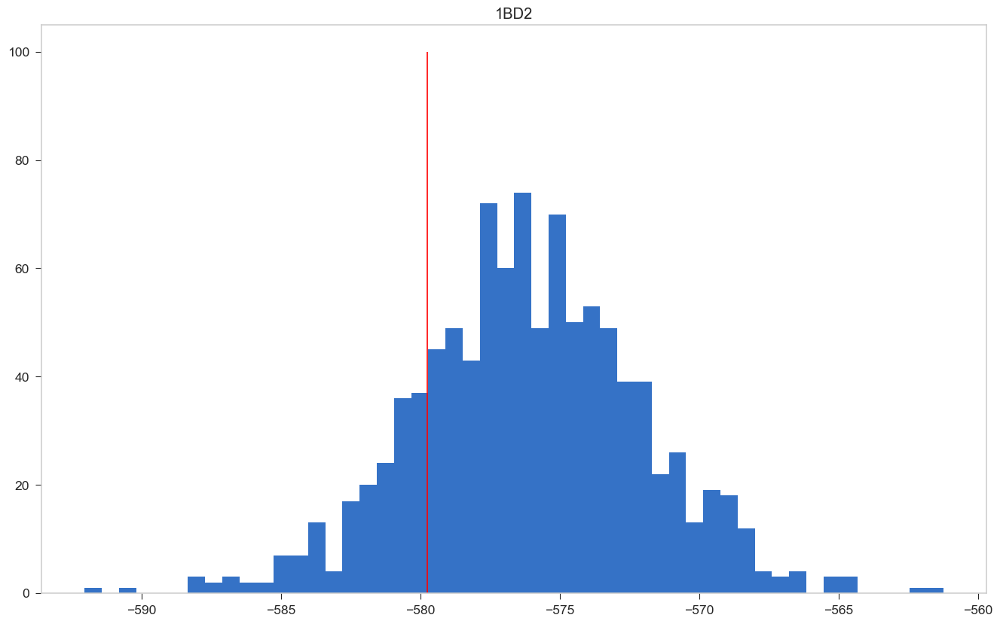

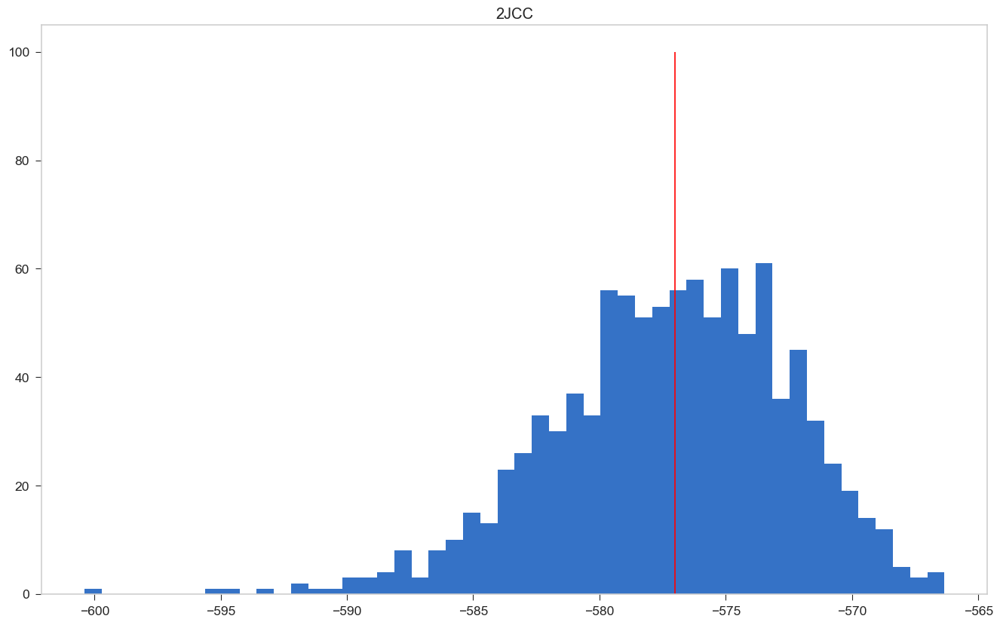

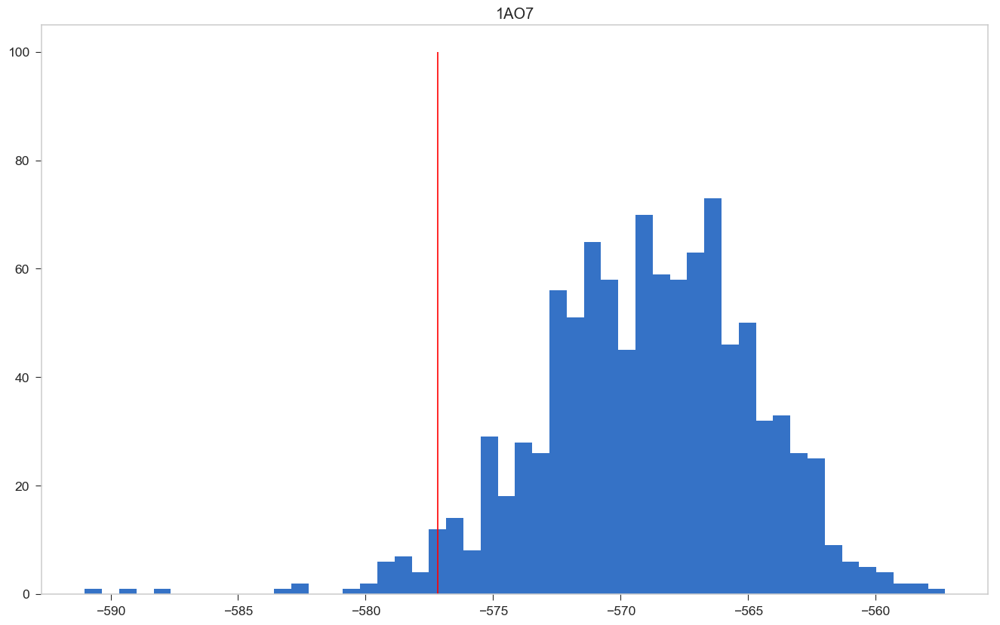

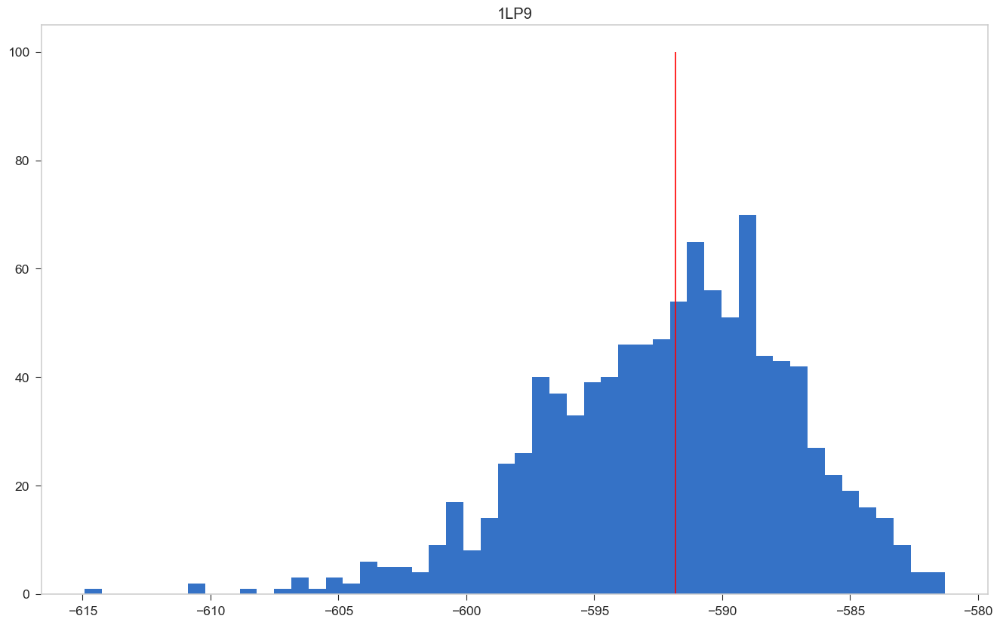

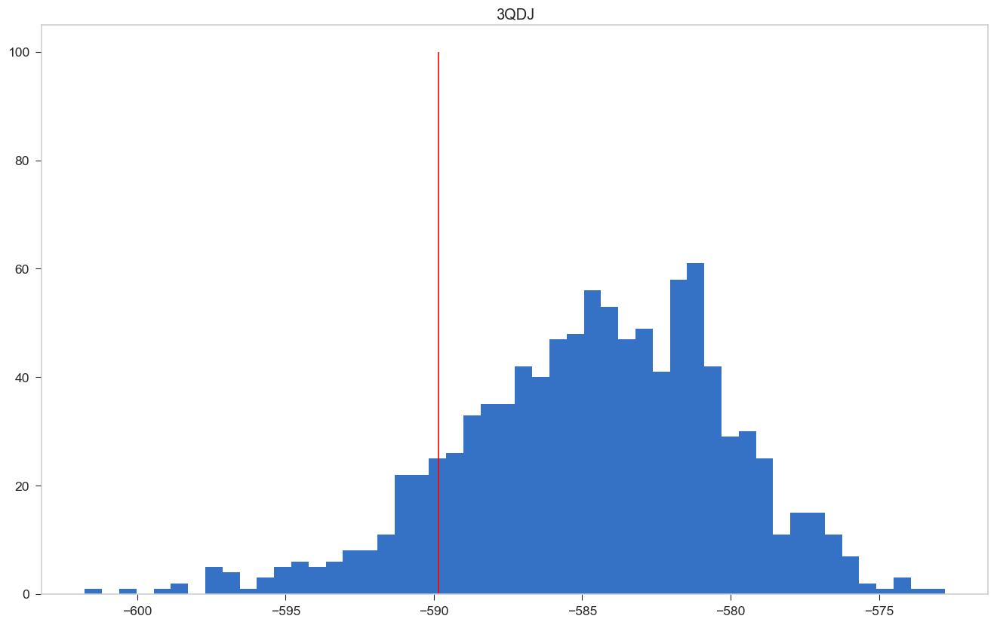

...

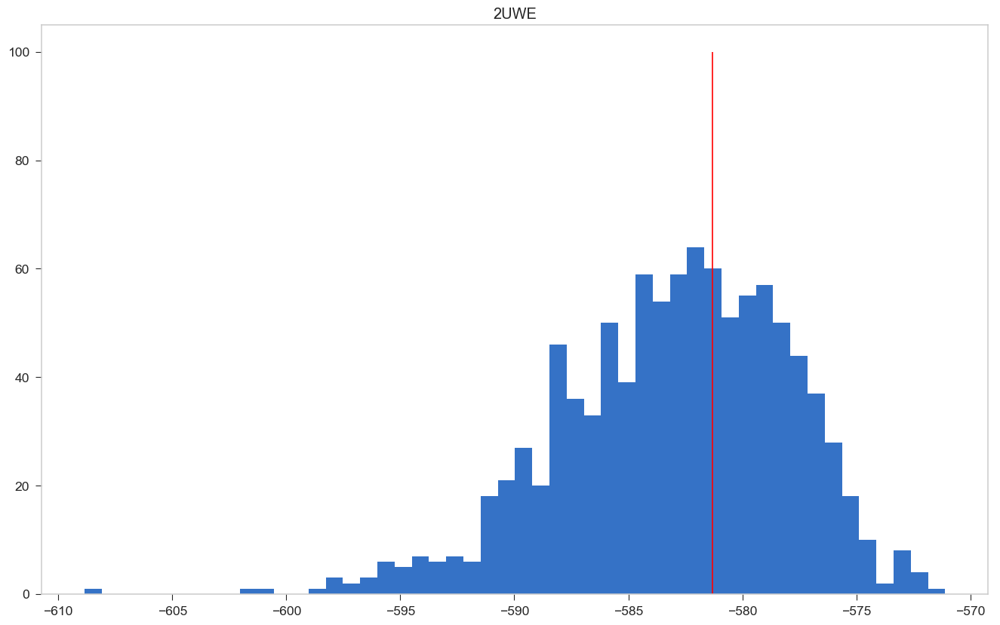

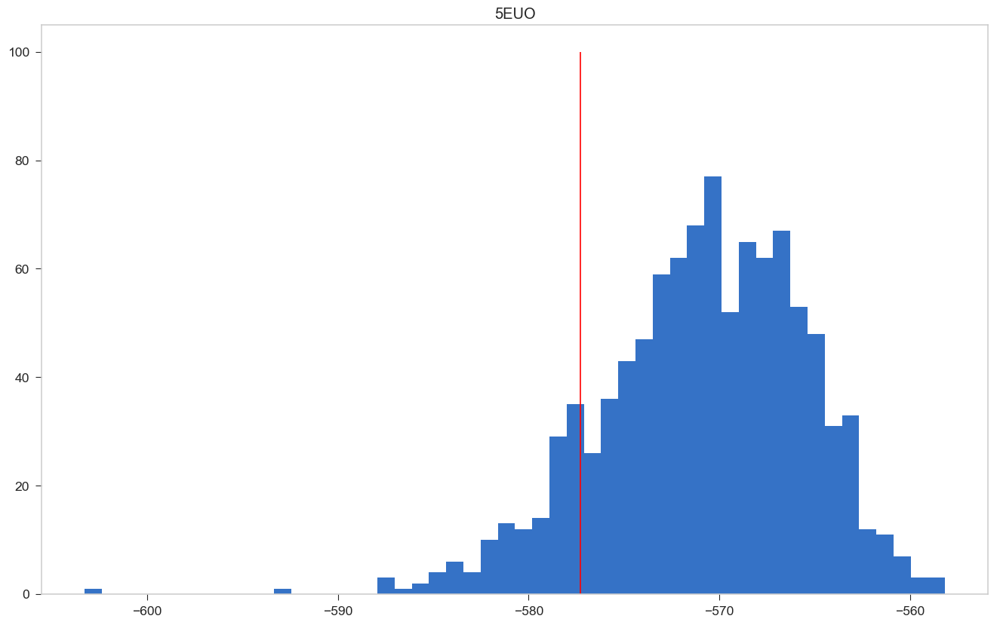

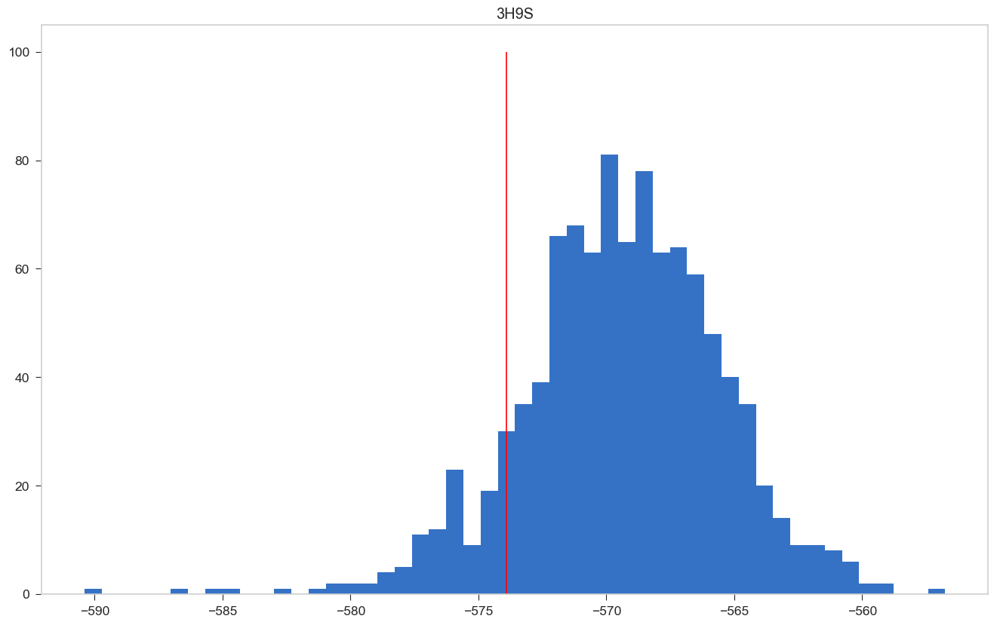

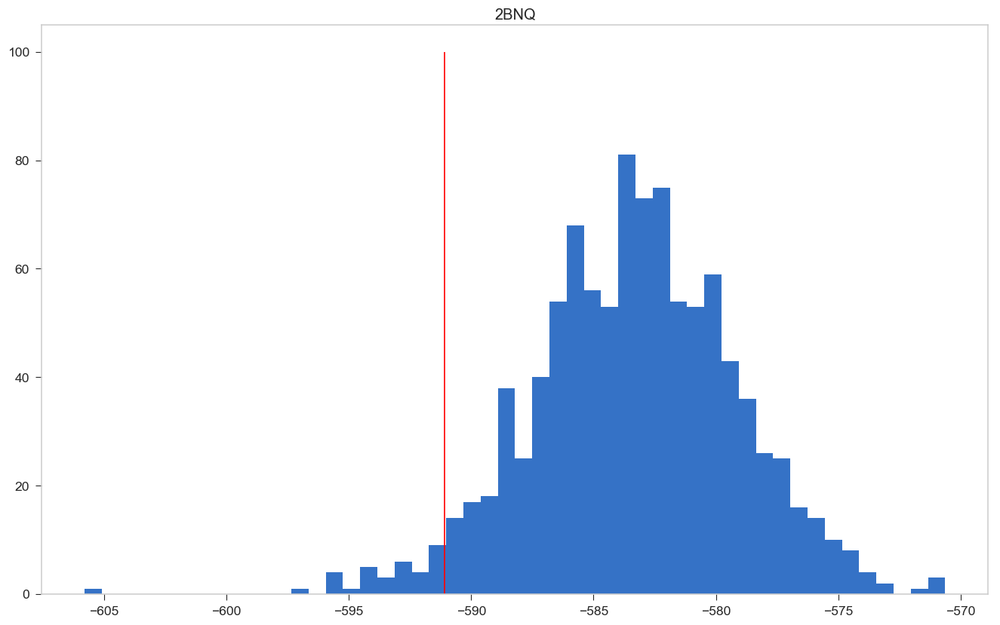

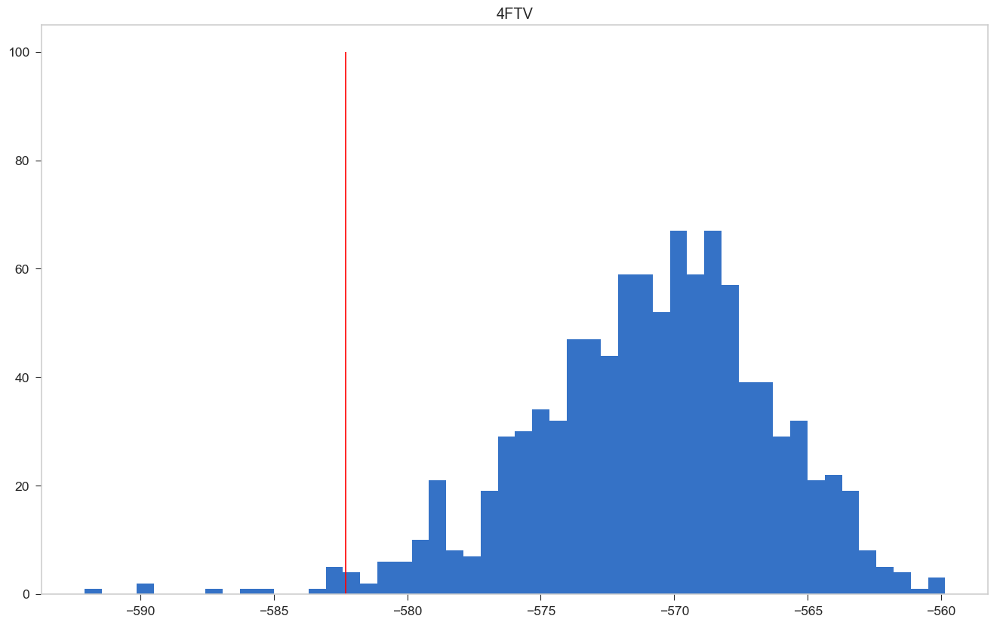

In [124]:
for name, e_native, e_decoy in zip(names, e_natives, e_decoys):
    # print(name)
    plt.figure()
    _ = plt.hist(e_decoy, bins=50)
    plt.vlines(e_native, ymin=0, ymax=100, color="red")
    _ = plt.title(name)
    plt.savefig(f"/Users/weilu/Dropbox/Optimization_Xfunnel/updated_figures/{name}.png")
    

In [125]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_4_duplicate/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_4_cutoff100_impose_Aprime_constraint"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


0 3.508959112034475


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2,3.508959,-590.408659,-576.119892,4.072082
1,2JCC,6.406843,-607.314444,-577.222713,4.696811
2,1AO7,5.530768,-592.327551,-569.008721,4.216201
3,1LP9,6.310993,-622.609479,-592.084044,4.836867
4,3QDJ,4.901757,-606.525572,-584.644281,4.463969
5,3GSN,1.854756,-580.017867,-572.453867,4.078164
6,1QRN,4.838191,-602.786617,-582.219358,4.251023
7,3PWP,6.154082,-600.250600,-574.765083,4.141238
8,5W1W,1.467168,-506.193262,-499.628928,4.474153
9,1QSE,5.029028,-592.782661,-572.004454,4.131655


In [31]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_4/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_3_cutoff100_impose_Aprime_constraint"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


210
420
60
0 11.93699656742965
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2,11.936997,-664.061736,-575.776354,7.395946
1,2JCC,12.304886,-634.274622,-545.990733,7.174702
2,1AO7,12.016467,-674.865247,-572.358923,8.530488
3,1LP9,12.089640,-651.642492,-563.736447,7.271188
4,3QDJ,10.340876,-687.301314,-600.915062,8.353862
5,3GSN,11.114498,-674.278587,-590.125101,7.571506
6,1QRN,12.077819,-686.270903,-586.175261,8.287559
7,3PWP,10.945414,-673.525681,-582.026367,8.359602
8,5W1W,5.443101,-551.073543,-501.203245,9.162111
9,1QSE,12.577687,-682.868237,-580.147438,8.166907


In [16]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_2_cutoff100_impose_Aprime_constraint"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list_tiny", gamma_file_name, "shuffle", 1000, mode=0)
data


210
420
60
0 8.849450826769093
210
420
60
210
420
60
210
420
60
210
420
60


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1,8.849451,-672.109604,-598.080169,8.365427
1,2,9.270943,-681.915179,-611.143850,7.633671
2,3,8.089534,-645.301463,-578.332365,8.278486
3,4,8.240793,-671.306528,-606.010473,7.923516
4,5,7.439003,-645.968912,-584.637773,8.244537


In [39]:
# mix gammas so that we don't overfitting too much.
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/original_gamma"
original_gamma = np.loadtxt(gamma_file_name)
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_3_cutoff100_impose_Aprime_constraint"
gamma_new = np.loadtxt(gamma_file_name)

alpha = 0.5
alpha_percent = int(alpha*100)
mixed_gamma = alpha*original_gamma + (1-alpha)*gamma_new
save_gamma_pre = "/Users/weilu/Research/server/sep_2019/saved_gammas/"
np.savetxt(f"{save_gamma_pre}/trial_3_mixed_original_and_cutoff100_impose_Aprime_constraint_{alpha_percent}", mixed_gamma)

In [41]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_4/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_3_mixed_original_and_cutoff100_impose_Aprime_constraint_50"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


0 6.823294613794194


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2,6.823295,-621.412295,-574.576567,6.864093
1,2JCC,6.342357,-617.516039,-572.981643,7.021742
2,1AO7,7.975743,-616.342840,-563.312714,6.648926
3,1LP9,6.317982,-629.015696,-584.468087,7.050923
4,3QDJ,6.120892,-637.294333,-591.466530,7.487112
5,3GSN,6.509687,-624.507495,-580.107055,6.820672
6,1QRN,7.837941,-629.275159,-573.215709,7.152319
7,3PWP,7.342186,-618.907910,-573.103238,6.238561
8,5W1W,3.714787,-533.994620,-509.264413,6.657235
9,1QSE,7.879351,-618.050427,-568.862540,6.242632


In [38]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_4/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/mixed_original_and_cutoff100_impose_Aprime_constraint"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


210
420
60
0 3.8751684860532514
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2,3.875168,-634.484887,-558.400163,19.633914
1,2JCC,2.789012,-604.568227,-552.849857,18.543620
2,1AO7,3.325161,-633.382103,-569.322420,19.265137
3,1LP9,2.752028,-611.365417,-558.915238,19.058741
4,3QDJ,3.556798,-651.956384,-578.535294,20.642471
5,3GSN,4.099164,-674.638570,-585.798746,21.672671
6,1QRN,3.722246,-650.179577,-574.708866,20.275583
7,3PWP,3.100221,-635.314643,-575.245667,19.375710
8,5W1W,2.574534,-497.246335,-456.227335,15.932592
9,1QSE,3.070116,-629.613946,-570.720402,19.182840


In [36]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_4/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_3_mixed_original_and_cutoff100_impose_Aprime_constraint_80"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list", gamma_file_name, "shuffle", 1000, mode=0)
data


210
420
60
0 2.5365697412845893
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2,2.536570,-595.822630,-573.856694,8.659701
1,2JCC,1.925393,-607.460889,-589.176189,9.496608
2,1AO7,2.894548,-581.229395,-557.884989,8.064957
3,1LP9,1.931806,-615.439619,-596.907071,9.593378
4,3QDJ,2.275837,-607.290144,-585.797411,9.443879
5,3GSN,2.414709,-594.644840,-574.096228,8.509769
6,1QRN,3.321020,-595.077712,-565.439977,8.924287
7,3PWP,2.432179,-586.137247,-567.749360,7.560253
8,5W1W,1.237414,-523.747267,-514.101114,7.795411
9,1QSE,2.232644,-579.159742,-562.091600,7.644812


In [23]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_2/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_2_mixed_original_and_cutoff100_impose_Aprime_constraint_80"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list_small", gamma_file_name, "shuffle", 1000, mode=0)
data


210
420
60
0 4.644053322015458
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2_1,4.644053,-580.211577,-550.187949,6.464962
1,6BJ8_1,3.644353,-584.591439,-557.302772,7.487932
2,2JCC_1,3.595958,-596.931478,-571.579622,7.050099
3,1AO7_1,3.888880,-585.161512,-555.292123,7.680717
4,1LP9_1,3.343277,-585.803512,-561.447871,7.284961
5,3QDJ_1,4.780158,-578.779196,-548.984082,6.233082
6,3GSN_1,3.760090,-570.671920,-541.173748,7.845071
7,1QRN_1,4.093077,-585.305336,-559.627225,6.273547
8,3PWP_1,3.828864,-598.379609,-570.653536,7.241332
9,5W1W_1,4.471712,-583.760125,-554.346778,6.577648


In [18]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_2/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_2_mixed_original_and_cutoff100_impose_Aprime_constraint_95"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list_small", gamma_file_name, "shuffle", 1000, mode=0)
data


210
420
60
0 1.721204322270767
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2_1,1.721204,-569.075571,-556.298031,7.423604
1,6BJ8_1,1.069227,-565.680672,-556.581484,8.510059
2,2JCC_1,0.915701,-583.206879,-575.925241,7.951984
3,1AO7_1,1.274523,-562.452529,-551.131293,8.882722
4,1LP9_1,0.729411,-575.793478,-569.582883,8.514531
5,3QDJ_1,1.521287,-556.321344,-545.745615,6.951831
6,3GSN_1,1.387840,-552.387176,-539.909435,8.990762
7,1QRN_1,0.933743,-562.850447,-556.210651,7.110943
8,3PWP_1,1.035444,-577.786546,-569.200396,8.292242
9,5W1W_1,1.573403,-568.499296,-556.713740,7.490488


In [21]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_2/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/trial_2_mixed_original_and_cutoff100_impose_Aprime_constraint_90"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list_small", gamma_file_name, "shuffle", 1000, mode=0)
data


210
420
60
0 2.6207785744536953
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2_1,2.620779,-572.787573,-554.261337,7.068982
1,6BJ8_1,1.863768,-571.984261,-556.821913,8.135322
2,2JCC_1,1.745512,-587.781745,-574.476701,7.622429
3,1AO7_1,2.072237,-570.022190,-552.518237,8.446887
4,1LP9_1,1.517396,-579.130156,-566.871212,8.078936
5,3QDJ_1,2.551696,-563.807295,-546.825104,6.655257
6,3GSN_1,2.115572,-558.482091,-540.330873,8.579815
7,1QRN_1,1.909748,-570.335410,-557.349509,6.799800
8,3PWP_1,1.892032,-584.650900,-569.684776,7.910079
9,5W1W_1,2.470159,-573.586239,-555.924753,7.149938


In [20]:
os.chdir("/Users/weilu/Research/server/sep_2019/peptide_optimization_trial_2/optimization/")
# gamma_file_name = "gamma_iter1_combined_mar06.dat"
# gamma_file_name = "/Users/weilu/Research/server/sep_2019/peptide_optimization/saved_gammas/cutoff100"
gamma_file_name = "/Users/weilu/Research/server/sep_2019/saved_gammas/mixed_original_and_cutoff100_impose_Aprime_constraint"

data = validate_hamiltonian_wei("phi_list.txt", "protein_list_small", gamma_file_name, "shuffle", 1000, mode=0)
data


210
420
60
0 3.7941745445367365
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60
210
420
60


,Protein,Z_scores,E_native,E_mgs,Std_mg
0,1BD2_1,3.794175,-590.306113,-529.530818,16.018054
1,6BJ8_1,3.795499,-635.532599,-567.801255,17.845175
2,2JCC_1,3.420750,-594.460605,-539.662072,16.019449
3,1AO7_1,3.672911,-613.428707,-549.662733,17.361155
4,1LP9_1,3.353718,-588.521959,-534.184893,16.202037
5,3QDJ_1,3.985167,-609.107722,-540.568396,17.198608
6,3GSN_1,3.520095,-612.595721,-548.807714,18.121103
7,1QRN_1,3.844487,-611.860055,-552.349067,15.479565
8,3PWP_1,3.518534,-614.033381,-554.889086,16.809357
9,5W1W_1,3.880848,-568.954232,-506.888790,15.992753


In [74]:
fileName = "/Users/weilu/Research/server/oct_2019/GPCRs_reorder/simulation_setups/secondary/serotonin_1A_receptor/serotonin_1A_receptor_PROP/serotonin_1A_receptor.ss3"

In [85]:
d = pd.read_csv(fileName, comment="#", names=["i", "Res", "ss3", "Helix", "Sheet", "Coil"], sep="\s+")

In [86]:
d["ss3"].unique()

array(['C', 'H', 'E'], dtype=object)

In [2]:
from Bio.PDB.PDBParser import PDBParser

def computeRg(pdb_file, chain="A"):
    # compute Radius of gyration
    # pdb_file = f"/Users/weilu/Research/server/feb_2019/iterative_optimization_new_temp_range/all_simulations/{p}/{p}/crystal_structure.pdb"
    chain_name = chain
    parser = PDBParser()
    structure = parser.get_structure('X', pdb_file)
    chain = list(structure[0][chain_name])
    n = len(chain)
    rg = 0.0
    for i, residue_i in enumerate(chain):
        for j, residue_j in enumerate(chain[i+1:]):
            try:
                r = residue_i["CA"] - residue_j["CA"]
            except:
                print(residue_i, residue_j)
            rg += r**2
    return (rg/(n**2))**0.5

rg = computeRg("/Users/weilu/Research/server/oct_2019/GPCRs_reorder/simulation_setups/1su4.pdb")
print(rg)

<Residue MET het=  resseq=1 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue MET het=  resseq=1 icode= > <Residue HOH het=W resseq=2012 icode

<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2109 icode= >
<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2110 icode= >
<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2111 icode= >
<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2112 icode= >
<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2114 icode= >
<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2115 icode= >
<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue SER het=  resseq=8 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue THR het=  resseq=9 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue THR het=  resseq=9 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue THR het=  resseq=9 icode= > <Residue HOH het=W resseq=2002 icode

<Residue TYR het=  resseq=15 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue TYR het=  resseq=15 icode= > <Residue HOH het=W ress

<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2109 icode= >
<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2110 icode= >
<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2111 icode= >
<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2112 icode= >
<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2114 icode= >
<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2115 icode= >
<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue THR het=  resseq=21 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue THR het=  resseq=22 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue THR het=  resseq=22 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue THR het=  resseq=22 icode= > <Residue HOH het=W ress

<Residue VAL het=  resseq=29 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue LYS het=  resseq=30 icode= > <Residue HOH het=W ress

<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2049 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2050 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2051 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2052 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue GLY het=  resseq=37 icode= > <Residue HOH het=W resseq=

<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2028 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue GLU het=  resseq=44 icode= > <Residue HOH het=W resseq=

<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2085 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2086 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2087 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2088 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2089 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2090 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2091 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2092 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2093 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2094 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2095 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=2096 icode= >
<Residue GLU het=  resseq=51 icode= > <Residue HOH het=W resseq=

<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2051 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2052 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue ASP het=  resseq=59 icode= > <Residue HOH het=W resseq=

<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue LEU het=  resseq=67 icode= > <Residue HOH het=W resseq=

<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue VAL het=  resseq=74 icode= > <Residue HOH het=W resseq=

<Residue GLU het=  resseq=82 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue GLU het=  resseq=82 icode= > <Residue HOH het=W ress

<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2012 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=2013 icode= >
<Residue GLU het=  resseq=90 icode= > <Residue HOH het=W resseq=

<Residue LEU het=  resseq=98 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue LEU het=  resseq=98 icode= > <Residue HOH het=W ress

<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue VAL het=  resseq=106 icode= > <Residue HOH 

<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue ASN het=  resseq=114 icode= > <Residue HOH 

<Residue TYR het=  resseq=122 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue TYR het=  resseq=122 icode= > <Residue H

<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2075 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2076 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH het=W resseq=2077 icode= >
<Residue TYR het=  resseq=130 icode= > <Residue HOH 

<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2075 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2076 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH het=W resseq=2077 icode= >
<Residue GLN het=  resseq=138 icode= > <Residue HOH 

<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2082 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2083 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2084 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2085 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2086 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2087 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2088 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2089 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2090 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2091 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2092 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH het=W resseq=2093 icode= >
<Residue ILE het=  resseq=145 icode= > <Residue HOH 

<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2020 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2021 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2022 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2023 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2024 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2025 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2026 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2028 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue VAL het=  resseq=153 icode= > <Residue HOH 

<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2046 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2047 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2048 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2049 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2050 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH het=W resseq=2051 icode= >
<Residue ALA het=  resseq=161 icode= > <Residue HOH 

<Residue LYS het=  resseq=169 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue LYS het=  resseq=169 icode= > <Residue H

<Residue GLN het=  resseq=177 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue GLN het=  resseq=177 icode= > <Residue H

<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue VAL het=  resseq=185 icode= > <Residue HOH 

<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2028 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue PRO het=  resseq=193 icode= > <Residue HOH 

<Residue ASN het=  resseq=201 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue ASN het=  resseq=201 icode= > <Residue H

<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2085 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2086 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2087 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2088 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2089 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2090 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2091 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2092 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2093 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2094 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2095 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH het=W resseq=2096 icode= >
<Residue PHE het=  resseq=209 icode= > <Residue HOH 

<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2097 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2098 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2099 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2100 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2101 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2102 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2103 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2104 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2105 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2106 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2107 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue ALA het=  resseq=215 icode= > <Residue HOH 

<Residue VAL het=  resseq=223 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue VAL het=  resseq=223 icode= > <Residue H

<Residue GLU het=  resseq=231 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue GLU het=  resseq=231 icode= > <Residue H

<Residue GLN het=  resseq=238 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue GLN het=  resseq=238 icode= > <Residue H

<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2012 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2013 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2014 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2015 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2016 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2017 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH het=W resseq=2018 icode= >
<Residue ASP het=  resseq=245 icode= > <Residue HOH 

<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2075 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2076 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2077 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH het=W resseq=2078 icode= >
<Residue LEU het=  resseq=253 icode= > <Residue HOH 

<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2012 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2013 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2014 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2015 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2016 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2017 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2018 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2019 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2020 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2021 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH het=W resseq=2022 icode= >
<Residue SER het=  resseq=261 icode= > <Residue HOH 

<Residue VAL het=  resseq=269 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue VAL het=  resseq=269 icode= > <Residue H

<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2021 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2022 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2023 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2024 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2025 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2026 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2028 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue ILE het=  resseq=276 icode= > <Residue HOH 

<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2090 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2091 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2092 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2093 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2094 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2095 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2096 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2097 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2098 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2099 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2100 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH het=W resseq=2101 icode= >
<Residue HIS het=  resseq=284 icode= > <Residue HOH 

<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2095 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2096 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2097 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2098 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2099 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2100 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2101 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2102 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2103 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2104 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2105 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH het=W resseq=2106 icode= >
<Residue ALA het=  resseq=292 icode= > <Residue HOH 

<Residue LEU het=  resseq=302 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue LEU het=  resseq=302 icode= > <Residue H

<Residue GLY het=  resseq=310 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue GLY het=  resseq=310 icode= > <Residue H

<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue THR het=  resseq=317 icode= > <Residue HOH 

<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2075 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH het=W resseq=2076 icode= >
<Residue ARG het=  resseq=325 icode= > <Residue HOH 

<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2052 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue VAL het=  resseq=333 icode= > <Residue HOH 

<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2050 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2051 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2052 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue GLU het=  resseq=340 icode= > <Residue HOH 

<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2024 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2025 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2026 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2028 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue VAL het=  resseq=347 icode= > <Residue HOH 

<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2091 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2092 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2093 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2094 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2095 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2096 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2097 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2098 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2099 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2100 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2101 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH het=W resseq=2102 icode= >
<Residue LEU het=  resseq=356 icode= > <Residue HOH 

<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2086 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2087 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2088 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2089 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2090 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2091 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2092 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2093 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2094 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2095 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2096 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH het=W resseq=2097 icode= >
<Residue MET het=  resseq=366 icode= > <Residue HOH 

<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2102 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2103 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2104 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2105 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2106 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2107 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2109 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2110 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2111 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2112 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue GLY het=  resseq=374 icode= > <Residue HOH 

<Residue ILE het=  resseq=384 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue ILE het=  resseq=384 icode= > <Residue H

<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2022 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2023 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2024 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2025 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2026 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2028 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue GLY het=  resseq=393 icode= > <Residue HOH 

<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2046 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2047 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2048 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2049 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2050 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2051 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2052 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue ILE het=  resseq=402 icode= > <Residue HOH 

<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2028 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue VAL het=  resseq=411 icode= > <Residue HOH 

<Residue CYS het=  resseq=420 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue CYS het=  resseq=420 icode= > <Residue H

<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2051 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2052 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue ASN het=  resseq=428 icode= > <Residue HOH 

<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2026 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2028 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2030 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2031 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue GLY het=  resseq=438 icode= > <Residue HOH 

<Residue THR het=  resseq=447 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue THR het=  resseq=447 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue THR het=  resseq=447 icode= > <Residue H

<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue ASN het=  resseq=456 icode= > <Residue HOH 

<Residue VAL het=  resseq=465 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue VAL het=  resseq=465 icode= > <Residue H

<Residue SER het=  resseq=473 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue SER het=  resseq=473 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue SER het=  resseq=473 icode= > <Residue H

<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2051 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2052 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue LYS het=  resseq=481 icode= > <Residue HOH 

<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue ASP het=  resseq=490 icode= > <Residue HOH 

<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2106 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2107 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2109 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2110 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2111 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2112 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2114 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2115 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue SER het=  resseq=499 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue PRO het=  resseq=500 icode= > <Residue  NA 

<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2109 icode= >
<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2110 icode= >
<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2111 icode= >
<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2112 icode= >
<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2114 icode= >
<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2115 icode= >
<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue VAL het=  resseq=508 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue GLY het=  resseq=509 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue GLY het=  resseq=509 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue GLY het=  resseq=509 icode= > <Residue H

<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2018 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2019 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2020 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2021 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2022 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2023 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2024 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2025 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2026 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2028 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH het=W resseq=2029 icode= >
<Residue GLU het=  resseq=519 icode= > <Residue HOH 

<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2016 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2017 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2018 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2019 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2020 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2021 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2022 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2023 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2024 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2025 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2026 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH het=W resseq=2027 icode= >
<Residue TYR het=  resseq=527 icode= > <Residue HOH 

<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2109 icode= >
<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2110 icode= >
<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2111 icode= >
<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2112 icode= >
<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2114 icode= >
<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2115 icode= >
<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue PRO het=  resseq=536 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue MET het=  resseq=537 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue MET het=  resseq=537 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue MET het=  resseq=537 icode= > <Residue H

<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue ILE het=  resseq=545 icode= > <Residue HOH 

<Residue GLY het=  resseq=555 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue GLY het=  resseq=555 icode= > <Residue HOH het=W resseq=2114 icode= >
<Residue GLY het=  resseq=555 icode= > <Residue HOH het=W resseq=2115 icode= >
<Residue GLY het=  resseq=555 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue GLY het=  resseq=555 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue ARG het=  resseq=556 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue ARG het=  resseq=556 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue ARG het=  resseq=556 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue ARG het=  resseq=556 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue ARG het=  resseq=556 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue ARG het=  resseq=556 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue ARG het=  resseq=556 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue ARG het=  resseq=556 icode= > <Residue H

<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue ALA het=  resseq=565 icode= > <Residue HOH 

<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue ARG het=  resseq=573 icode= > <Residue HOH 

<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2046 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH het=W resseq=2047 icode= >
<Residue ARG het=  resseq=583 icode= > <Residue HOH 

<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue THR het=  resseq=592 icode= > <Residue HOH 

<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2046 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2047 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2048 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2049 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2050 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2051 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2052 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue ASP het=  resseq=601 icode= > <Residue HOH 

<Residue SER het=  resseq=610 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue SER het=  resseq=610 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue SER het=  resseq=610 icode= > <Residue H

<Residue VAL het=  resseq=621 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue VAL het=  resseq=621 icode= > <Residue H

<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue GLY het=  resseq=630 icode= > <Residue HOH 

<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2013 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2014 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2015 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2016 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2017 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2018 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2019 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2020 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2021 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2022 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2023 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH het=W resseq=2024 icode= >
<Residue GLY het=  resseq=640 icode= > <Residue HOH 

<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue ALA het=  resseq=649 icode= > <Residue HOH 

<Residue PHE het=  resseq=658 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue PHE het=  resseq=658 icode= > <Residue HOH het=W resseq=2114 icode= >
<Residue PHE het=  resseq=658 icode= > <Residue HOH het=W resseq=2115 icode= >
<Residue PHE het=  resseq=658 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue PHE het=  resseq=658 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue ASP het=  resseq=659 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue ASP het=  resseq=659 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue ASP het=  resseq=659 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue ASP het=  resseq=659 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue ASP het=  resseq=659 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue ASP het=  resseq=659 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue ASP het=  resseq=659 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue ASP het=  resseq=659 icode= > <Residue H

<Residue ALA het=  resseq=669 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue ALA het=  resseq=669 icode= > <Residue H

<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2097 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2098 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2099 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2100 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2101 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2102 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2103 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2104 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2105 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2106 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2107 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue ARG het=  resseq=678 icode= > <Residue HOH 

<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2012 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2013 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2014 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH het=W resseq=2015 icode= >
<Residue VAL het=  resseq=688 icode= > <Residue HOH 

<Residue THR het=  resseq=698 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue THR het=  resseq=698 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue THR het=  resseq=698 icode= > <Residue H

<Residue VAL het=  resseq=705 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue VAL het=  resseq=705 icode= > <Residue H

<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2014 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2015 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2016 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2017 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2018 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2019 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2020 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2021 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2022 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2023 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2024 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH het=W resseq=2025 icode= >
<Residue LEU het=  resseq=711 icode= > <Residue HOH 

<Residue MET het=  resseq=720 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue GLY het=  resseq=721 icode= > <Residue H

<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH het=W resseq=2075 icode= >
<Residue ALA het=  resseq=730 icode= > <Residue HOH 

<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2075 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2076 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2077 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2078 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2079 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2080 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2081 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2082 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2083 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH het=W resseq=2084 icode= >
<Residue PHE het=  resseq=740 icode= > <Residue HOH 

<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2084 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2085 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2086 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2087 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2088 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2089 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2090 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2091 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2092 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2093 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2094 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH het=W resseq=2095 icode= >
<Residue GLY het=  resseq=750 icode= > <Residue HOH 

<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2046 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH het=W resseq=2047 icode= >
<Residue ILE het=  resseq=761 icode= > <Residue HOH 

<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue GLU het=  resseq=771 icode= > <Residue HOH 

<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH het=W resseq=2046 icode= >
<Residue LEU het=  resseq=781 icode= > <Residue HOH 

<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2075 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH het=W resseq=2076 icode= >
<Residue GLN het=  resseq=791 icode= > <Residue HOH 

<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue LEU het=  resseq=802 icode= > <Residue HOH 

<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue PRO het=  resseq=812 icode= > <Residue HOH 

<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2098 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2099 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2100 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2101 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2102 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2103 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2104 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2105 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2106 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2107 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH het=W resseq=2109 icode= >
<Residue PRO het=  resseq=821 icode= > <Residue HOH 

<Residue LEU het=  resseq=833 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue LEU het=  resseq=833 icode= > <Residue H

<Residue TYR het=  resseq=843 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue VAL het=  resseq=844 icode= > <Residue H

<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2100 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2101 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2102 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2103 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2104 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2105 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2106 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2107 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2109 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2110 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH het=W resseq=2111 icode= >
<Residue TRP het=  resseq=854 icode= > <Residue HOH 

<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2084 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2085 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2086 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2087 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2088 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2089 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2090 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2091 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2092 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2093 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2094 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH het=W resseq=2095 icode= >
<Residue VAL het=  resseq=865 icode= > <Residue HOH 

<Residue GLN het=  resseq=875 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue GLN het=  resseq=875 icode= > <Residue H

<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue LEU het=  resseq=886 icode= > <Residue HOH 

<Residue PRO het=  resseq=896 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue PRO het=  resseq=896 icode= > <Residue H

<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2046 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2047 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2048 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2049 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2050 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2051 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2052 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue THR het=  resseq=906 icode= > <Residue HOH 

<Residue GLU het=  resseq=918 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue GLU het=  resseq=918 icode= > <Residue H

<Residue ILE het=  resseq=931 icode= > <Residue  NA het=H_ NA resseq=997 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2001 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2002 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2003 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2004 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2005 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2006 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2007 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2008 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2009 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2010 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue HOH het=W resseq=2011 icode= >
<Residue ILE het=  resseq=931 icode= > <Residue H

<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2102 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2103 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2104 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2105 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2106 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2107 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2108 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2109 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2110 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2111 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2112 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue MET het=  resseq=941 icode= > <Residue HOH 

<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue PRO het=  resseq=952 icode= > <Residue HOH 

<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue LEU het=  resseq=962 icode= > <Residue HOH 

<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2065 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue ILE het=  resseq=973 icode= > <Residue HOH 

<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2066 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2067 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2068 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2069 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2070 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2071 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2072 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2073 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2075 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2076 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH het=W resseq=2077 icode= >
<Residue PHE het=  resseq=986 icode= > <Residue HOH 

<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2074 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2075 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2076 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2077 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2078 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2079 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2080 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2081 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2082 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2083 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2084 icode= >
<Residue HOH het=W resseq=2001 icode= > <Residue HOH het=W resseq=2085 icode= >
<Residue HOH het=W resseq=2001 icode= > 

<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2053 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2054 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2055 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2056 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2057 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2058 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2059 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2060 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2061 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2062 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2063 icode= >
<Residue HOH het=W resseq=2013 icode= > <Residue HOH het=W resseq=2064 icode= >
<Residue HOH het=W resseq=2013 icode= > 

<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2032 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2033 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2034 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2035 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2036 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2037 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2038 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2039 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2040 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2041 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2042 icode= >
<Residue HOH het=W resseq=2026 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue HOH het=W resseq=2026 icode= > 

<Residue HOH het=W resseq=2041 icode= > <Residue HOH het=W resseq=2112 icode= >
<Residue HOH het=W resseq=2041 icode= > <Residue HOH het=W resseq=2113 icode= >
<Residue HOH het=W resseq=2041 icode= > <Residue HOH het=W resseq=2114 icode= >
<Residue HOH het=W resseq=2041 icode= > <Residue HOH het=W resseq=2115 icode= >
<Residue HOH het=W resseq=2041 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue HOH het=W resseq=2041 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue HOH het=W resseq=2042 icode= > <Residue HOH het=W resseq=2043 icode= >
<Residue HOH het=W resseq=2042 icode= > <Residue HOH het=W resseq=2044 icode= >
<Residue HOH het=W resseq=2042 icode= > <Residue HOH het=W resseq=2045 icode= >
<Residue HOH het=W resseq=2042 icode= > <Residue HOH het=W resseq=2046 icode= >
<Residue HOH het=W resseq=2042 icode= > <Residue HOH het=W resseq=2047 icode= >
<Residue HOH het=W resseq=2042 icode= > <Residue HOH het=W resseq=2048 icode= >
<Residue HOH het=W resseq=2042 icode= > 

<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2096 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2097 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2098 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2099 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2100 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2101 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2102 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2103 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2104 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2105 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2106 icode= >
<Residue HOH het=W resseq=2062 icode= > <Residue HOH het=W resseq=2107 icode= >
<Residue HOH het=W resseq=2062 icode= > 

<Residue HOH het=W resseq=2114 icode= > <Residue HOH het=W resseq=2115 icode= >
<Residue HOH het=W resseq=2114 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue HOH het=W resseq=2114 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue HOH het=W resseq=2115 icode= > <Residue HOH het=W resseq=2116 icode= >
<Residue HOH het=W resseq=2115 icode= > <Residue HOH het=W resseq=2117 icode= >
<Residue HOH het=W resseq=2116 icode= > <Residue HOH het=W resseq=2117 icode= >
37.61314930713402


In [3]:
# chain_name = chain
parser = PDBParser()
pdb_file = "/Users/weilu/Research/server/oct_2019/GPCRs_reorder/simulation_setups/1su4.pdb"
structure = parser.get_structure('X', pdb_file)



In [5]:
all_residues = list(structure.get_residues())

In [6]:
res = all_residues[0]

In [ ]:

res_id = res.get_id()[0]
if res_id == ' ':

In [8]:
regular_res_list = [res for res in all_residues  if res.get_id()[0] == ' ']

In [15]:
within_membrane_res = []
for res in regular_res_list:
    ca = res["CA"]
    z = ca.get_coord()[2]
    if abs(z) < 15:
        within_membrane_res.append(res)

In [17]:
len(within_membrane_res)

243

In [18]:
len(regular_res_list)

994

In [ ]:
for i, residue_i in enumerate(chain):
    for j, residue_j in enumerate(chain[i+1:]):
        try:
            r = residue_i["CA"] - residue_j["CA"]
        except:
            print(residue_i, residue_j)
        rg += r**2
return (rg/(n**2))**0.5
res_id = res.get_id()[0]
if (res_id == ' ' or res_id == 'H_MSE' or res_id == 'H_M3L' or res_id == 'H_CAS') and is_regular_res:

In [25]:
from Bio.PDB.PDBParser import PDBParser
from Bio.PDB.PDBIO import PDBIO
from Bio.PDB.PDBIO import Select
def extractTransmembrane(toLocation, location, cutoff=15):
    x = PDBParser().get_structure("x", location)

    class Transmembrane(Select):
        def accept_residue(self, residue):
            if residue.get_id()[0] == ' ' and abs(residue["CA"].get_vector()[-1]) < cutoff:
                return 1
            else:
                return 0

    io = PDBIO()
    io.set_structure(x)
    io.save(toLocation, Transmembrane())

pdb_file = "/Users/weilu/Research/server/oct_2019/GPCRs_reorder/simulation_setups/1su4.pdb"
pdb_file_2 = "/Users/weilu/Research/server/oct_2019/GPCRs_reorder/simulation_setups/1su4_membrane.pdb"
extractTransmembrane(pdb_file_2, pdb_file)

In [26]:
pdb_file = "/Users/weilu/Research/server/oct_2019/GPCRs_reorder/simulation_setups/1su4.pdb"
pdb_file_2 = "/Users/weilu/Research/server/oct_2019/GPCRs_reorder/simulation_setups/1su4_membrane.pdb"
extractTransmembrane(pdb_file_2, pdb_file)

In [27]:
res.id

(' ', 994, ' ')

In [28]:
res.get_resname()

'GLY'

In [ ]:
plt.savefig()